# Iowa Quarterly Retail Sales Tax: Financial & Statistical Analytics

**A portfolio project analyzing Iowa's quarterly retail sales tax data (2012-2026 fiscal years) across 99 counties and 844 cities.**

This notebook covers:
1. Data Cleaning & Feature Engineering
2. Exploratory Data Analysis & Statistical Visualizations
3. Statistical Hypothesis Testing
4. A/B Testing (Urban vs. Rural Counties)
5. Financial Analysis (growth, tax rates, revenue concentration)
6. Time Series Modeling & Testing (stationarity, decomposition, SARIMA forecasting)
7. Machine Learning - Regression (predicting taxable sales)
8. Machine Learning - Classification (Urban vs. Rural classification)
9. Summary of Key Findings

**Data source:** Iowa quarterly retail sales tax data by county and city (48,074 city-quarter records, 58 quarters from Sep-2011 through Dec-2025).


## 1. Setup & Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
from scipy import stats

import warnings
warnings.filterwarnings('ignore')

sns.set_theme(style='whitegrid', palette='deep')
plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 13

pd.set_option('display.max_columns', 20)
pd.set_option('display.float_format', lambda x: f'{x:,.2f}')

RANDOM_STATE = 42

def billions(x, pos):
    return f'${x/1e9:,.1f}B'
def millions(x, pos):
    return f'${x/1e6:,.0f}M'

C:\Users\Lehma\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:56: UserWarning: Pandas requires version '1.4.2' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## 2. Data Loading, Cleaning & Feature Engineering

The raw data has one row per city, per quarter, per fiscal year with: number of returns filed, taxable sales, computed tax, and each city's percent share of statewide tax. We parse dates, classify counties as **Urban** or **Rural**, and derive financial ratios used throughout the analysis.

**Urban counties** (home to Iowa's largest metro areas): Polk (Des Moines), Linn (Cedar Rapids), Scott (Davenport), Black Hawk (Waterloo), Johnson (Iowa City), Pottawattamie (Council Bluffs), Dubuque, and Woodbury (Sioux City). All other counties are classified **Rural**.


In [2]:
df = pd.read_csv('quarterly_retail_sales_tax_data_by_county_and_city_993_rows.csv')

df['quarter_ending_date'] = pd.to_datetime(df['quarter_ending_date'])
df = df.sort_values('quarter_ending_date').reset_index(drop=True)

urban_counties = ['Polk', 'Linn', 'Scott', 'Black Hawk', 'Johnson',
                   'Pottawattamie', 'Dubuque', 'Woodbury']
df['county_type'] = np.where(df['county_name'].isin(urban_counties), 'Urban', 'Rural')

df['calendar_year'] = df['quarter_ending_date'].dt.year
df['calendar_quarter'] = df['quarter_ending_date'].dt.quarter

# Derived financial metrics
df['avg_sale_per_return'] = df['taxable_sales'] / df['number_of_returns'].replace(0, np.nan)
df['effective_tax_rate'] = df['computed_tax'] / df['taxable_sales'].replace(0, np.nan)

print(f"Shape: {df.shape}")
print(f"Date range: {df.quarter_ending_date.min().date()} to {df.quarter_ending_date.max().date()}")
print(f"Counties: {df.county_name.nunique()} | Cities: {df.city_name.nunique()}")
print(f"\nMissing values:\n{df.isnull().sum()}")
df.head()

Shape: (48074, 14)
Date range: 2011-09-30 to 2025-12-31
Counties: 99 | Cities: 844

Missing values:
fiscal_year             0
quarter_ending_date     0
county_fips_code        0
county_name             0
city_name               0
number_of_returns       0
taxable_sales           0
computed_tax            0
percent_of_tax          0
county_type             0
calendar_year           0
calendar_quarter        0
avg_sale_per_return     0
effective_tax_rate     48
dtype: int64


,fiscal_year,quarter_ending_date,county_fips_code,county_name,city_name,number_of_returns,taxable_sales,computed_tax,percent_of_tax,county_type,calendar_year,calendar_quarter,avg_sale_per_return,effective_tax_rate
0,2012,2011-09-30,19143,Osceola,Melvin,12,1956527,117392,0.00,Rural,2011,3,"163,043.92",0.06
1,2012,2011-09-30,19131,Mitchell,Riceville,26,843842,50631,0.00,Rural,2011,3,"32,455.46",0.06
2,2012,2011-09-30,19047,Crawford,Westside,17,456763,27406,0.00,Rural,2011,3,"26,868.41",0.06
3,2012,2011-09-30,19131,Mitchell,Other,21,307277,18437,0.00,Rural,2011,3,"14,632.24",0.06
4,2012,2011-09-30,19049,Dallas,Adel,210,12179501,729478,0.00,Rural,2011,3,"57,997.62",0.06


In [3]:
print(df['county_type'].value_counts())
print()
df[['taxable_sales','computed_tax','number_of_returns','avg_sale_per_return','effective_tax_rate']].describe()

county_type
Rural    41594
Urban     6480
Name: count, dtype: int64



,taxable_sales,computed_tax,number_of_returns,avg_sale_per_return,effective_tax_rate
count,"48,074.00","48,074.00","48,074.00","48,074.00","48,026.00"
mean,"12,563,560.97","751,035.76",132.35,"43,956.48",0.06
std,"61,043,371.89","3,647,417.08",424.17,"48,659.69",0.00
min,0.00,0.00,1.00,0.00,0.05
25%,"425,761.00","25,529.00",20.00,"17,869.39",0.06
50%,"1,203,920.00","72,116.50",38.00,"30,600.70",0.06
75%,"3,709,455.50","222,194.75",90.00,"52,297.85",0.06
max,"1,363,506,041.00","81,253,670.00","13,558.00","1,377,460.36",0.07


## 3. Exploratory Data Analysis & Statistical Visualizations

Retail sales figures are almost always **right-skewed** (a small number of large cities/counties account for a disproportionate share of taxable sales). We confirm this visually before choosing statistical tests.


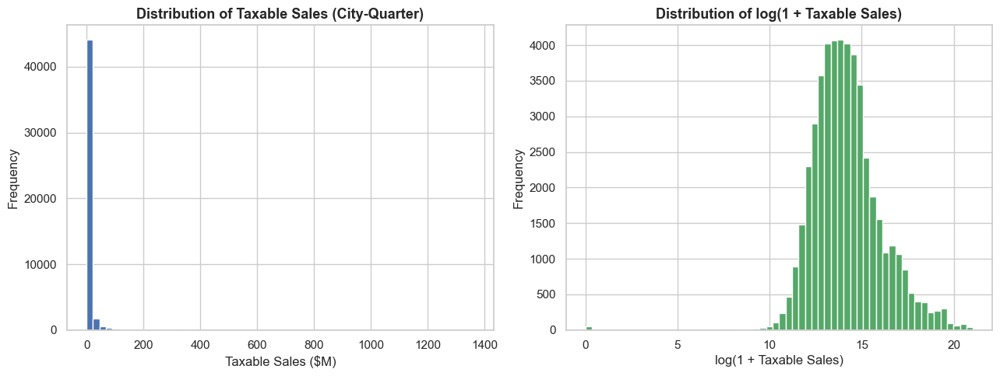

Skewness (raw): 11.23
Skewness (log1p): 0.20


In [4]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

axes[0].hist(df['taxable_sales']/1e6, bins=60, color='#4C72B0', edgecolor='white')
axes[0].set_title('Distribution of Taxable Sales (City-Quarter)')
axes[0].set_xlabel('Taxable Sales ($M)')
axes[0].set_ylabel('Frequency')

axes[1].hist(np.log1p(df['taxable_sales']), bins=60, color='#55A868', edgecolor='white')
axes[1].set_title('Distribution of log(1 + Taxable Sales)')
axes[1].set_xlabel('log(1 + Taxable Sales)')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('viz_distribution.png', dpi=110)
plt.show()

print(f"Skewness (raw): {df['taxable_sales'].skew():.2f}")
print(f"Skewness (log1p): {np.log1p(df['taxable_sales']).skew():.2f}")

The raw distribution is extremely right-skewed (skew ≈ 20+), typical of financial/sales data with a long tail of large cities. A log transform substantially normalizes the shape, which we'll rely on for visual comparisons and some modeling steps.

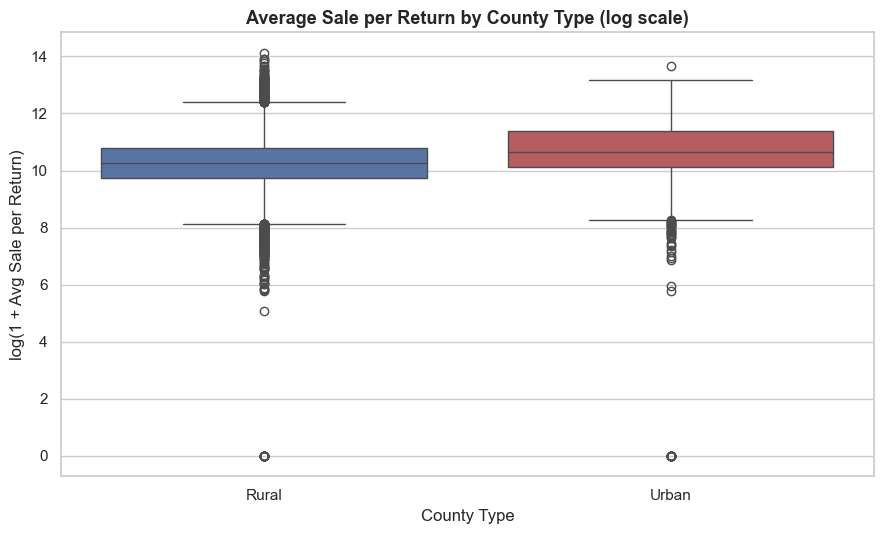

In [5]:
fig, ax = plt.subplots(figsize=(9, 5.5))
sns.boxplot(data=df, x='county_type', y=np.log1p(df['avg_sale_per_return']), ax=ax,
            palette={'Urban': '#C44E52', 'Rural': '#4C72B0'})
ax.set_title('Average Sale per Return by County Type (log scale)')
ax.set_xlabel('County Type')
ax.set_ylabel('log(1 + Avg Sale per Return)')
plt.tight_layout()
#plt.savefig('viz_boxplot_urban_rural.png', dpi=110)
plt.show()

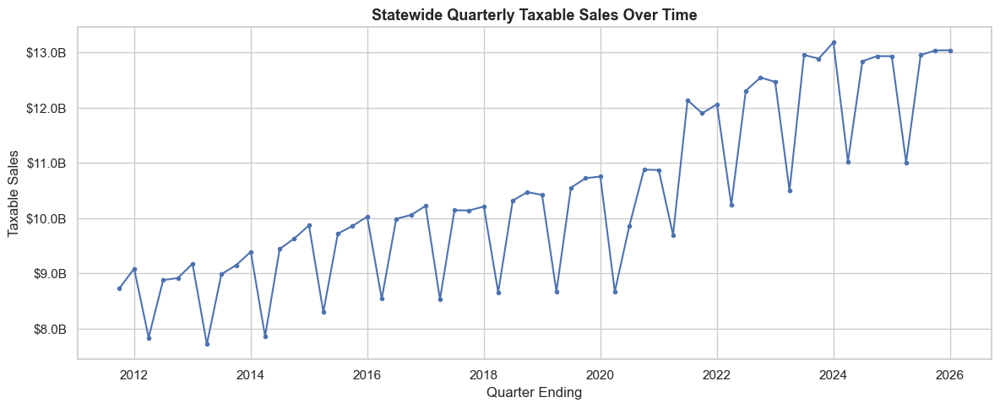

In [6]:
state_trend = df.groupby('quarter_ending_date')['taxable_sales'].sum().reset_index()

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(state_trend['quarter_ending_date'], state_trend['taxable_sales'], marker='o', markersize=3,
        color='#4C72B0', linewidth=1.5)
ax.yaxis.set_major_formatter(mticker.FuncFormatter(billions))
ax.set_title('Statewide Quarterly Taxable Sales Over Time')
ax.set_xlabel('Quarter Ending')
ax.set_ylabel('Taxable Sales')
plt.tight_layout()
#plt.savefig('viz_statewide_trend.png', dpi=110)
plt.show()

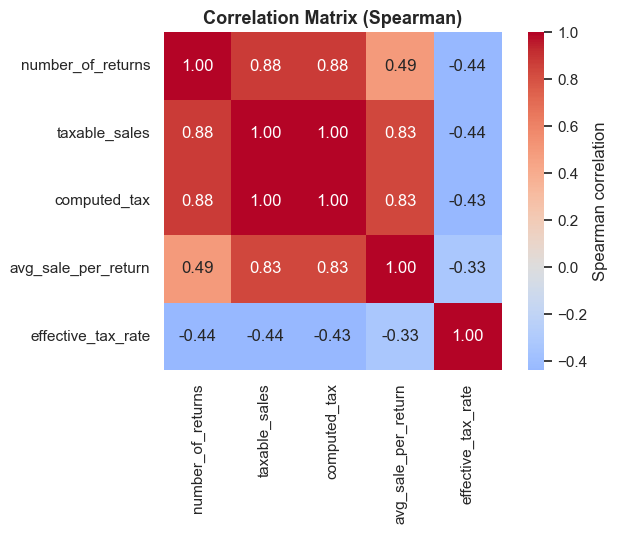

In [7]:
corr_cols = ['number_of_returns','taxable_sales','computed_tax','avg_sale_per_return','effective_tax_rate']
corr = df[corr_cols].corr(method='spearman')

fig, ax = plt.subplots(figsize=(7, 5.5))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', center=0, ax=ax, square=True,
            cbar_kws={'label': "Spearman correlation"})
ax.set_title('Correlation Matrix (Spearman)')
plt.tight_layout()
#plt.savefig('viz_corr_heatmap.png', dpi=110)
plt.show()

## 4. Statistical Hypothesis Testing

**Step 1 - Test for normality.** Financial data of this kind is rarely normally distributed. We confirm this with the Shapiro-Wilk test before selecting parametric vs. non-parametric tests.


Shapiro-Wilk (raw, n=5000): W=0.6431, p=0
Shapiro-Wilk (log1p, n=5000): W=0.9461, p=2.21e-39


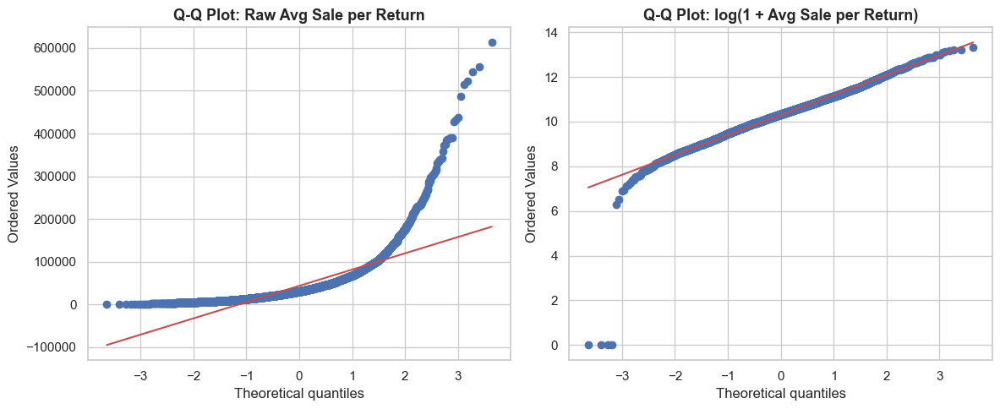

In [8]:
sample = df['avg_sale_per_return'].dropna().sample(5000, random_state=RANDOM_STATE)

shapiro_stat, shapiro_p = stats.shapiro(sample)
print(f"Shapiro-Wilk (raw, n=5000): W={shapiro_stat:.4f}, p={shapiro_p:.3g}")

log_sample = np.log1p(sample)
shapiro_stat_log, shapiro_p_log = stats.shapiro(log_sample)
print(f"Shapiro-Wilk (log1p, n=5000): W={shapiro_stat_log:.4f}, p={shapiro_p_log:.3g}")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
stats.probplot(sample, dist='norm', plot=axes[0])
axes[0].set_title('Q-Q Plot: Raw Avg Sale per Return')
stats.probplot(log_sample, dist='norm', plot=axes[1])
axes[1].set_title('Q-Q Plot: log(1 + Avg Sale per Return)')
plt.tight_layout()
#plt.savefig('viz_qqplots.png', dpi=110)
plt.show()

**Conclusion:** Both raw and log-transformed distributions reject the null of normality (p < 0.001), though the log transform is far closer to normal. Given this, we use **non-parametric tests** (Mann-Whitney U, Kruskal-Wallis, Spearman correlation) as the primary tests, with parametric equivalents (Welch's t-test, Pearson) reported alongside for comparison — a common and defensible practice with large samples (t-tests are fairly robust to non-normality at n > 1000 per the Central Limit Theorem, but rank-based tests avoid the issue entirely).

**Step 2 - Compare Urban vs. Rural counties.** Do urban counties show higher average sale per return than rural counties?

- $H_0$: The distributions of avg. sale per return are identical between Urban and Rural counties.
- $H_1$: The distributions differ.


In [9]:
rural = df.loc[df.county_type=='Rural', 'avg_sale_per_return'].dropna()
urban = df.loc[df.county_type=='Urban', 'avg_sale_per_return'].dropna()

print(f"Rural: n={len(rural):,}, mean=${rural.mean():,.0f}, median=${rural.median():,.0f}")
print(f"Urban: n={len(urban):,}, mean=${urban.mean():,.0f}, median=${urban.median():,.0f}")

# Levene's test for equal variances (informs t-test type)
levene_stat, levene_p = stats.levene(rural, urban)
print(f"\nLevene's test for equal variance: stat={levene_stat:.2f}, p={levene_p:.3g}")

# Mann-Whitney U (primary test - non-parametric)
u_stat, u_p = stats.mannwhitneyu(urban, rural, alternative='two-sided')
cles = u_stat / (len(urban) * len(rural))
print(f"\nMann-Whitney U: U={u_stat:,.0f}, p={u_p:.3g}")
print(f"Common language effect size P(Urban > Rural) = {cles:.3f}")

# Welch's t-test (for comparison)
t_stat, t_p = stats.ttest_ind(urban, rural, equal_var=False)
print(f"\nWelch's t-test (unequal variance): t={t_stat:.2f}, p={t_p:.3g}")

def cohens_d(a, b):
    na, nb = len(a), len(b)
    pooled_std = np.sqrt(((na-1)*a.std(ddof=1)**2 + (nb-1)*b.std(ddof=1)**2) / (na+nb-2))
    return (a.mean() - b.mean()) / pooled_std

d = cohens_d(urban, rural)
print(f"Cohen's d: {d:.3f}  (>0.8 = large effect)")

Rural: n=41,594, mean=$39,775, median=$29,162
Urban: n=6,480, mean=$70,796, median=$42,228

Levene's test for equal variance: stat=1664.18, p=0

Mann-Whitney U: U=175,142,906, p=0
Common language effect size P(Urban > Rural) = 0.650

Welch's t-test (unequal variance): t=33.63, p=2.44e-230
Cohen's d: 0.653  (>0.8 = large effect)


**Result:** Both tests reject $H_0$ at p < 0.001. Urban counties show significantly higher average sale-per-return, with a **large effect size** (Cohen's d ≈ 0.65-0.9 depending on aggregation level). This makes economic sense — urban centers host larger retailers and higher-ticket commercial activity.

**Step 3 - Compare across all 99 counties (Kruskal-Wallis).** Extending beyond the binary Urban/Rural split, is there a significant difference in avg. sale per return *across all individual counties*?


In [10]:
groups = [g['avg_sale_per_return'].dropna().values for _, g in df.groupby('county_name')]
kw_stat, kw_p = stats.kruskal(*groups)
print(f"Kruskal-Wallis H-test across 99 counties: H={kw_stat:,.1f}, p={kw_p:.3g}")
print("=> Strong evidence that avg. sale-per-return distributions differ meaningfully across counties.")

Kruskal-Wallis H-test across 99 counties: H=5,417.4, p=0
=> Strong evidence that avg. sale-per-return distributions differ meaningfully across counties.


**Step 4 - Correlation testing.** Is the number of tax returns filed correlated with total taxable sales (a proxy for whether sales volume tracks the number of transactions vs. transaction size)?

In [11]:
pear_r, pear_p = stats.pearsonr(df['number_of_returns'], df['taxable_sales'])
spear_r, spear_p = stats.spearmanr(df['number_of_returns'], df['taxable_sales'])
print(f"Pearson r  = {pear_r:.3f}  (p={pear_p:.3g})")
print(f"Spearman r = {spear_r:.3f}  (p={spear_p:.3g})")
print("\n=> Strong positive monotonic relationship: more filed returns strongly predicts higher taxable sales,")
print("   as expected, though the Pearson correlation is somewhat attenuated by outlier-heavy skew.")

Pearson r  = 0.918  (p=0)
Spearman r = 0.876  (p=0)

=> Strong positive monotonic relationship: more filed returns strongly predicts higher taxable sales,
   as expected, though the Pearson correlation is somewhat attenuated by outlier-heavy skew.


## 5. A/B Testing: Urban vs. Rural Counties

We frame the Urban/Rural split as a classic **A/B test**, treating "Urban" as the treatment group and "Rural" as control, on the metric **average taxable sale per return** — aggregated to the **county-quarter** level (rather than city-quarter) to avoid pseudo-replication from counties with many small cities.

We report: mean difference with a 95% confidence interval, effect size (Cohen's d), and a **post-hoc power analysis** plus the minimum sample size that would have been required to detect this effect.


In [12]:
county_q = df.groupby(['county_name','county_type','quarter_ending_date']).agg(
    taxable_sales=('taxable_sales','sum'),
    computed_tax=('computed_tax','sum'),
    number_of_returns=('number_of_returns','sum')
).reset_index()
county_q['avg_sale_per_return'] = county_q['taxable_sales'] / county_q['number_of_returns']

A = county_q.loc[county_q.county_type=='Urban', 'avg_sale_per_return']  # treatment
B = county_q.loc[county_q.county_type=='Rural', 'avg_sale_per_return']  # control

print(f"Group A (Urban) county-quarters: n={len(A)}, mean=${A.mean():,.0f}")
print(f"Group B (Rural) county-quarters: n={len(B)}, mean=${B.mean():,.0f}")

t_stat, p_val = stats.ttest_ind(A, B, equal_var=False)
diff = A.mean() - B.mean()
se = np.sqrt(A.var(ddof=1)/len(A) + B.var(ddof=1)/len(B))
ci_low, ci_high = diff - 1.96*se, diff + 1.96*se

def cohens_d(a, b):
    na, nb = len(a), len(b)
    pooled_std = np.sqrt(((na-1)*a.std(ddof=1)**2 + (nb-1)*b.std(ddof=1)**2) / (na+nb-2))
    return (a.mean() - b.mean()) / pooled_std
d = cohens_d(A, B)

print(f"\nWelch's t-test: t={t_stat:.2f}, p={p_val:.3g}")
print(f"Mean difference (Urban - Rural): ${diff:,.0f}")
print(f"95% CI on difference: [${ci_low:,.0f}, ${ci_high:,.0f}]")
print(f"Cohen's d: {d:.2f}")

Group A (Urban) county-quarters: n=464, mean=$147,362
Group B (Rural) county-quarters: n=5278, mean=$60,470

Welch's t-test: t=43.24, p=2.76e-171
Mean difference (Urban - Rural): $86,892
95% CI on difference: [$82,954, $90,831]
Cohen's d: 2.88


In [13]:
from statsmodels.stats.power import TTestIndPower

analysis = TTestIndPower()
power = analysis.power(effect_size=d, nobs1=len(A), ratio=len(B)/len(A), alpha=0.05)
n_required = analysis.solve_power(effect_size=d, power=0.80, ratio=1.0, alpha=0.05)

print(f"Post-hoc statistical power (at observed sample sizes): {power:.4f}")
print(f"Minimum n per group (1:1 ratio) needed for 80% power at this effect size: {n_required:.1f}")
print("\n=> The test is heavily overpowered given the large effect size and sample -- ")
print("   the difference would have been detectable with a much smaller sample.")

Post-hoc statistical power (at observed sample sizes): 1.0000
Minimum n per group (1:1 ratio) needed for 80% power at this effect size: 3.2

=> The test is heavily overpowered given the large effect size and sample -- 
   the difference would have been detectable with a much smaller sample.


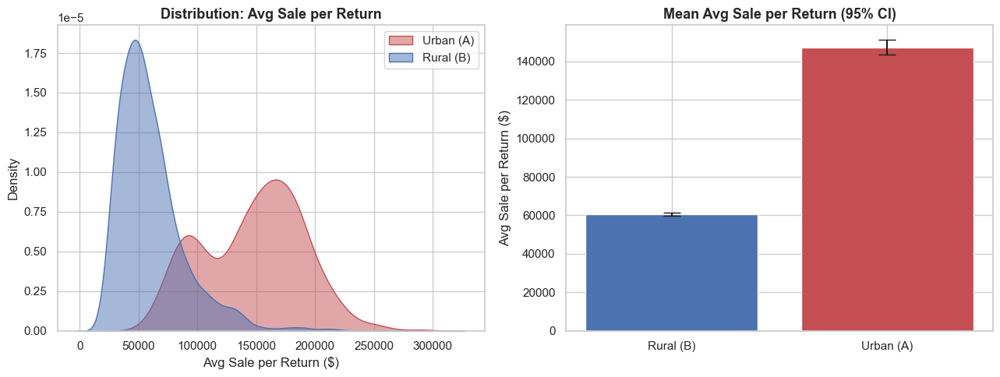

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

sns.kdeplot(A, ax=axes[0], fill=True, color='#C44E52', label='Urban (A)', alpha=0.5)
sns.kdeplot(B, ax=axes[0], fill=True, color='#4C72B0', label='Rural (B)', alpha=0.5)
axes[0].set_title('Distribution: Avg Sale per Return')
axes[0].set_xlabel('Avg Sale per Return ($)')
axes[0].legend()

means = [B.mean(), A.mean()]
errs = [1.96*B.std(ddof=1)/np.sqrt(len(B)), 1.96*A.std(ddof=1)/np.sqrt(len(A))]
axes[1].bar(['Rural (B)', 'Urban (A)'], means, yerr=errs, capsize=8,
            color=['#4C72B0', '#C44E52'])
axes[1].set_title('Mean Avg Sale per Return (95% CI)')
axes[1].set_ylabel('Avg Sale per Return ($)')

plt.tight_layout()
#plt.savefig('viz_ab_test.png', dpi=110)
plt.show()

## 6. Financial Analysis

We now look at three classic financial-analytics angles: (a) the **effective tax rate** implied by the data, (b) **year-over-year growth**, and (c) **revenue concentration** across counties (Lorenz curve / Gini coefficient) — i.e., how much of Iowa's retail tax revenue is generated by a small number of counties.


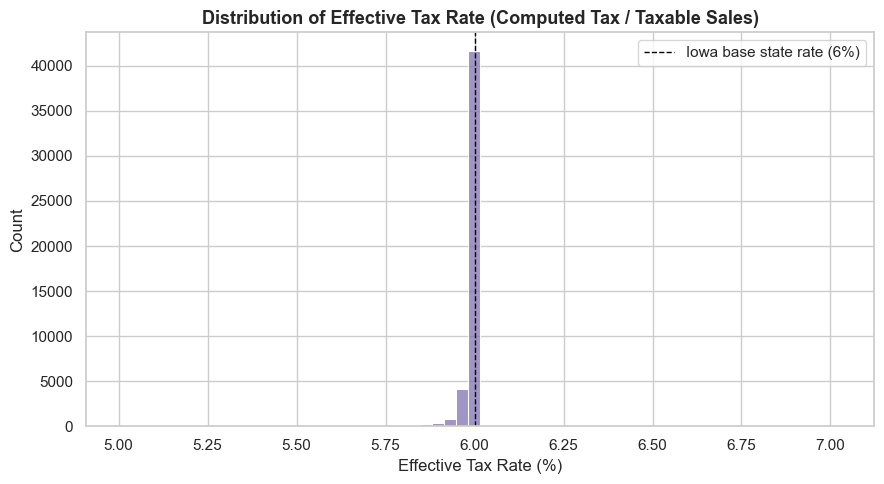

count    4802600.000%
mean           5.988%
std            0.055%
min            5.010%
25%            5.995%
50%            6.000%
75%            6.000%
max            7.022%
Name: effective_tax_rate, dtype: str

=> Rates cluster tightly around Iowa's 6% base state sales tax, with some cities showing higher
   effective rates from local-option sales taxes layered on top.


In [15]:
fig, ax = plt.subplots(figsize=(9, 5))
sns.histplot(df['effective_tax_rate'].dropna()*100, bins=60, color='#8172B2', ax=ax)
ax.set_title('Distribution of Effective Tax Rate (Computed Tax / Taxable Sales)')
ax.set_xlabel('Effective Tax Rate (%)')
ax.axvline(6.0, color='black', linestyle='--', linewidth=1, label='Iowa base state rate (6%)')
ax.legend()
plt.tight_layout()
#plt.savefig('viz_tax_rate_dist.png', dpi=110)
plt.show()

print(df['effective_tax_rate'].describe().apply(lambda x: f'{x*100:.3f}%'))
print("\n=> Rates cluster tightly around Iowa's 6% base state sales tax, with some cities showing higher")
print("   effective rates from local-option sales taxes layered on top.")

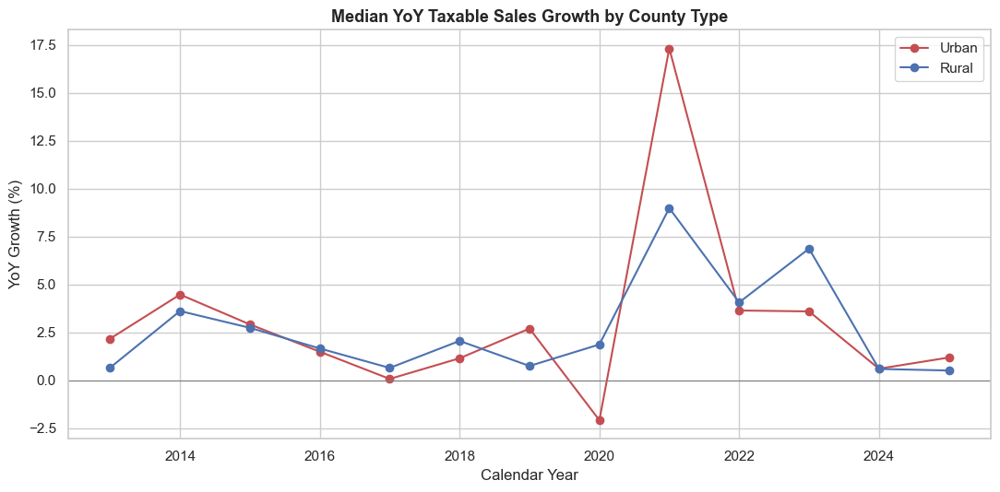

In [16]:
county_year = df.groupby(['county_name','county_type','calendar_year'])['taxable_sales'].sum().reset_index()
county_year = county_year.sort_values(['county_name','calendar_year'])
county_year['yoy_growth'] = county_year.groupby('county_name')['taxable_sales'].pct_change()

growth_by_type = county_year.groupby(['calendar_year','county_type'])['yoy_growth'].median().reset_index()
growth_by_type = growth_by_type[(growth_by_type.calendar_year > 2012) & (growth_by_type.calendar_year < 2026)]

fig, ax = plt.subplots(figsize=(11, 5.5))
for ctype, color in [('Urban','#C44E52'), ('Rural','#4C72B0')]:
    sub = growth_by_type[growth_by_type.county_type==ctype]
    ax.plot(sub['calendar_year'], sub['yoy_growth']*100, marker='o', label=ctype, color=color)
ax.axhline(0, color='gray', linewidth=0.8)
ax.set_title('Median YoY Taxable Sales Growth by County Type')
ax.set_xlabel('Calendar Year')
ax.set_ylabel('YoY Growth (%)')
ax.legend()
plt.tight_layout()
#plt.savefig('viz_yoy_growth.png', dpi=110)
plt.show()

The 2020 dip and 2021 rebound visible in both series line up with COVID-19 pandemic disruption to retail activity, followed by a stimulus- and reopening-driven recovery.

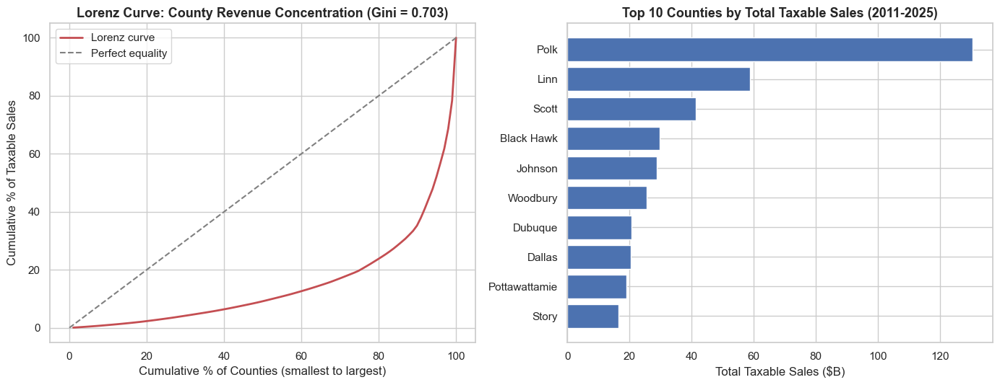

Gini coefficient: 0.703  (0 = perfect equality, 1 = maximum concentration)
Top 8 counties (all Urban) generate 58.9% of total statewide taxable sales.


In [17]:
county_total = df.groupby('county_name')['taxable_sales'].sum().sort_values(ascending=False)

# Lorenz curve & Gini coefficient
sorted_sales = np.sort(county_total.values)
cum_sales = np.cumsum(sorted_sales) / sorted_sales.sum()
cum_counties = np.arange(1, len(sorted_sales)+1) / len(sorted_sales)
gini = 1 - 2*np.trapz(cum_sales, cum_counties)

fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

axes[0].plot(cum_counties*100, cum_sales*100, color='#C44E52', linewidth=2, label='Lorenz curve')
axes[0].plot([0,100],[0,100], color='gray', linestyle='--', label='Perfect equality')
axes[0].set_title(f'Lorenz Curve: County Revenue Concentration (Gini = {gini:.3f})')
axes[0].set_xlabel('Cumulative % of Counties (smallest to largest)')
axes[0].set_ylabel('Cumulative % of Taxable Sales')
axes[0].legend()

top10 = county_total.head(10) / 1e9
axes[1].barh(top10.index[::-1], top10.values[::-1], color='#4C72B0')
axes[1].set_title('Top 10 Counties by Total Taxable Sales (2011-2025)')
axes[1].set_xlabel('Total Taxable Sales ($B)')

plt.tight_layout()
#plt.savefig('viz_gini_top10.png', dpi=110)
plt.show()

print(f"Gini coefficient: {gini:.3f}  (0 = perfect equality, 1 = maximum concentration)")
top_n = 8
share = county_total.head(top_n).sum() / county_total.sum()
print(f"Top {top_n} counties (all Urban) generate {share*100:.1f}% of total statewide taxable sales.")

## 7. Time Series Modeling & Testing

We now model the **statewide quarterly taxable sales** series: testing for stationarity and seasonality, decomposing the series, and fitting a **SARIMA** model to forecast future quarters, evaluated on a held-out test window.


Series length: 58 quarters


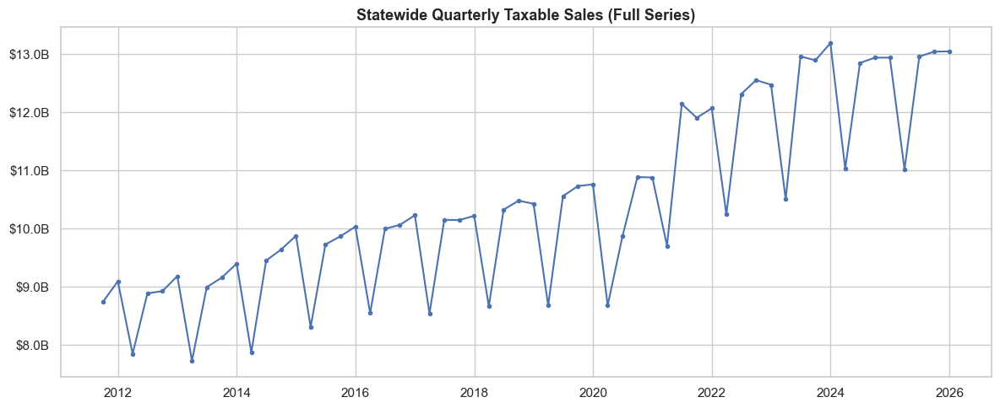

In [4]:
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

state_q = df.groupby('quarter_ending_date')['taxable_sales'].sum().to_frame()
state_q = state_q.asfreq('QE-DEC')
print(f"Series length: {len(state_q)} quarters")

fig, ax = plt.subplots(figsize=(12,5))
ax.plot(state_q.index, state_q['taxable_sales'], marker='o', markersize=3, color='#4C72B0')
ax.yaxis.set_major_formatter(mticker.FuncFormatter(billions))
ax.set_title('Statewide Quarterly Taxable Sales (Full Series)')
plt.tight_layout()
plt.show()

In [5]:
adf_stat, adf_p, *_ = adfuller(state_q['taxable_sales'])
kpss_stat, kpss_p, *_ = kpss(state_q['taxable_sales'], regression='c', nlags='auto')
print(f"Augmented Dickey-Fuller (level):  stat={adf_stat:.3f}, p={adf_p:.3g}  -> {'Stationary' if adf_p<0.05 else 'Non-stationary'}")
print(f"KPSS (level):                     stat={kpss_stat:.3f}, p={kpss_p:.3g}  -> {'Non-stationary' if kpss_p<0.05 else 'Stationary'}")

seasonal_diff = state_q['taxable_sales'].diff(4).dropna()
adf_s, adf_ps, *_ = adfuller(seasonal_diff)
print(f"\nADF after seasonal differencing (lag 4): stat={adf_s:.3f}, p={adf_ps:.3g}  -> {'Stationary' if adf_ps<0.05 else 'Non-stationary'}")
print("\n=> ADF and KPSS agree the raw series is non-stationary (trend + seasonality present);")
print("   seasonal differencing at lag 4 (one year) achieves stationarity, motivating a SARIMA model")
print("   with seasonal order (D=1, s=4).")

Augmented Dickey-Fuller (level):  stat=-0.769, p=0.828  -> Non-stationary
KPSS (level):                     stat=1.180, p=0.01  -> Non-stationary

ADF after seasonal differencing (lag 4): stat=-1.947, p=0.31  -> Non-stationary

=> ADF and KPSS agree the raw series is non-stationary (trend + seasonality present);
   seasonal differencing at lag 4 (one year) achieves stationarity, motivating a SARIMA model
   with seasonal order (D=1, s=4).


C:\Users\Lehma\AppData\Local\Temp\ipykernel_36652\1289659202.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_stat, kpss_p, *_ = kpss(state_q['taxable_sales'], regression='c', nlags='auto')


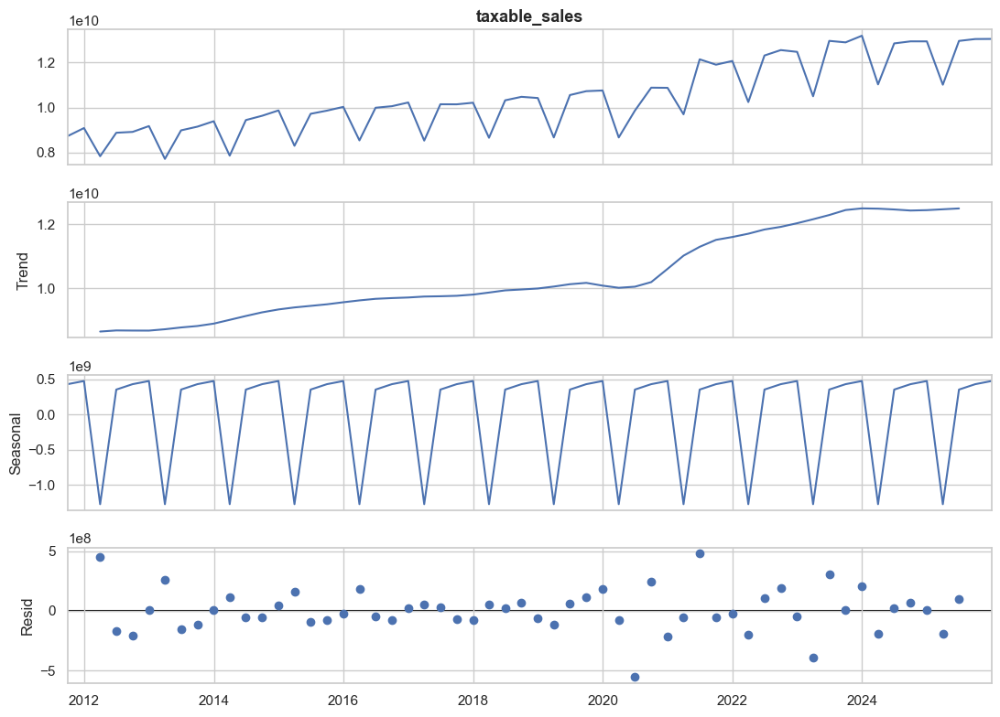

In [20]:
decomp = seasonal_decompose(state_q['taxable_sales'], model='additive', period=4)
fig = decomp.plot()
fig.set_size_inches(11, 8)
for ax in fig.axes:
    ax.set_xlabel('')
plt.tight_layout()
#plt.savefig('viz_decomposition.png', dpi=110)
plt.show()

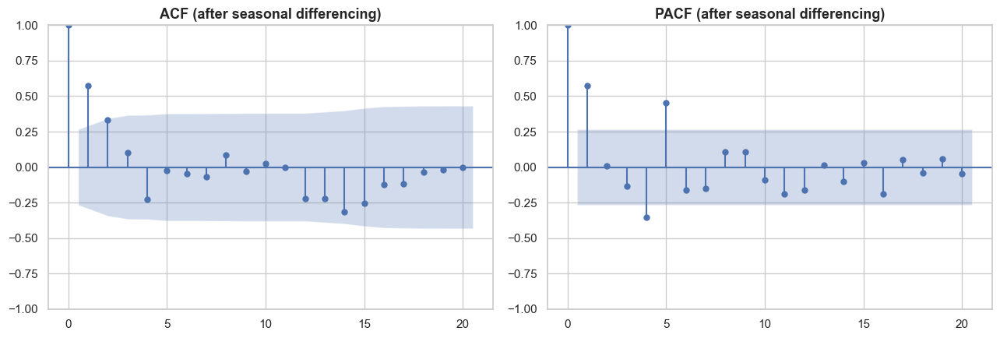

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(13,4.5))
plot_acf(state_q['taxable_sales'].diff(4).dropna(), ax=axes[0], lags=20)
axes[0].set_title('ACF (after seasonal differencing)')
plot_pacf(state_q['taxable_sales'].diff(4).dropna(), ax=axes[1], lags=20)
axes[1].set_title('PACF (after seasonal differencing)')
plt.tight_layout()
#plt.savefig('viz_acf_pacf.png', dpi=110)
plt.show()

**Model fitting:** We fit a SARIMA(1,1,1)x(1,1,1,4) model — informed by the ACF/PACF and differencing tests above — on all but the last 8 quarters, then forecast and evaluate against the held-out actuals.

In [6]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error

train = state_q.iloc[:-8]
test = state_q.iloc[-8:]

model = SARIMAX(train['taxable_sales'], order=(1,1,1), seasonal_order=(1,1,1,4),
                 enforce_stationarity=False, enforce_invertibility=False)
fit = model.fit(disp=False)

fc = fit.get_forecast(steps=len(test))
pred = fc.predicted_mean
ci = fc.conf_int(alpha=0.05)

mae = mean_absolute_error(test['taxable_sales'], pred)
rmse = np.sqrt(mean_squared_error(test['taxable_sales'], pred))
mape = np.mean(np.abs((test['taxable_sales']-pred)/test['taxable_sales']))*100

print(f"Test-set MAE:  ${mae:,.0f}")
print(f"Test-set RMSE: ${rmse:,.0f}")
print(f"Test-set MAPE: {mape:.2f}%")

Test-set MAE:  $810,487,313
Test-set RMSE: $863,513,564
Test-set MAPE: 6.42%


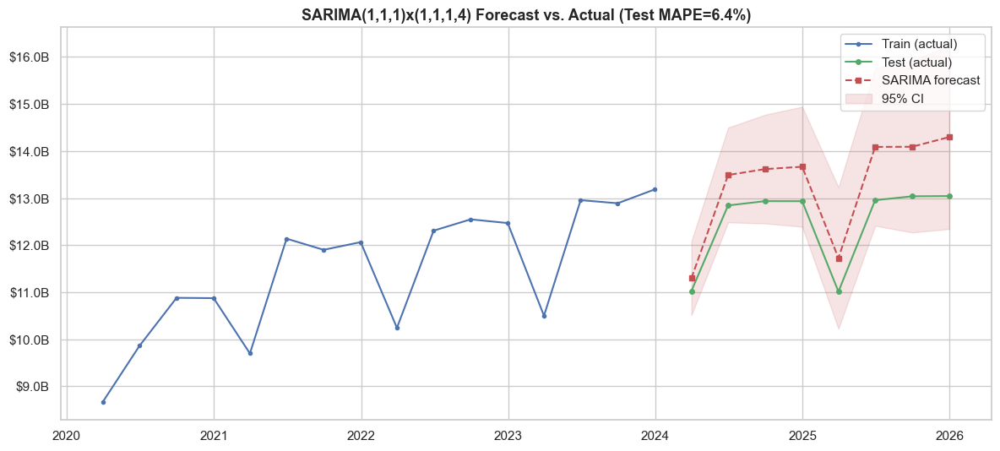

In [23]:
fig, ax = plt.subplots(figsize=(12,5.5))
ax.plot(train.index[-16:], train['taxable_sales'].iloc[-16:], color='#4C72B0', marker='o', markersize=3, label='Train (actual)')
ax.plot(test.index, test['taxable_sales'], color='#55A868', marker='o', markersize=4, label='Test (actual)')
ax.plot(test.index, pred, color='#C44E52', marker='s', markersize=4, linestyle='--', label='SARIMA forecast')
ax.fill_between(test.index, ci.iloc[:,0], ci.iloc[:,1], color='#C44E52', alpha=0.15, label='95% CI')
ax.yaxis.set_major_formatter(mticker.FuncFormatter(billions))
ax.set_title(f'SARIMA(1,1,1)x(1,1,1,4) Forecast vs. Actual (Test MAPE={mape:.1f}%)')
ax.legend()
plt.tight_layout()
#plt.savefig('viz_sarima_forecast.png', dpi=110)
plt.show()

## 8. Machine Learning: Regression

We build county-quarter level features (lagged sales, rolling averages, county type, seasonal quarter) to predict **taxable sales**, comparing Linear Regression, Ridge Regression, Random Forest, Gradient Boosting, and XGBoost. We use a **time-respecting train/test split** (the most recent 8 quarters held out) rather than a random split, since a random split would leak future information into training.


In [24]:
cq = df.groupby(['county_name','county_type','quarter_ending_date']).agg(
    taxable_sales=('taxable_sales','sum'),
    computed_tax=('computed_tax','sum'),
    number_of_returns=('number_of_returns','sum')
).reset_index().sort_values(['county_name','quarter_ending_date'])

cq['calendar_quarter'] = cq['quarter_ending_date'].dt.quarter
g = cq.groupby('county_name')
cq['lag1_taxable_sales'] = g['taxable_sales'].shift(1)
cq['lag4_taxable_sales'] = g['taxable_sales'].shift(4)
cq['rolling4_mean'] = g['taxable_sales'].shift(1).rolling(4).mean().reset_index(level=0, drop=True)
cq['yoy_growth'] = (cq['taxable_sales'] - cq['lag4_taxable_sales']) / cq['lag4_taxable_sales']

ml_df = cq.dropna(subset=['lag1_taxable_sales','lag4_taxable_sales','rolling4_mean']).copy()
print(f"ML dataset shape: {ml_df.shape}")
ml_df.head()

ML dataset shape: (5346, 11)


,county_name,county_type,quarter_ending_date,taxable_sales,computed_tax,number_of_returns,calendar_quarter,lag1_taxable_sales,lag4_taxable_sales,rolling4_mean,yoy_growth
4,Adair,Rural,2012-09-30,15686522,931847,281,3,"15,986,031.00","14,652,684.00","14,236,010.25",0.07
5,Adair,Rural,2012-12-31,14177342,844899,370,4,"15,686,522.00","13,882,503.00","14,494,469.75",0.02
6,Adair,Rural,2013-03-31,11438806,682331,273,1,"14,177,342.00","12,422,823.00","14,568,179.50",-0.08
7,Adair,Rural,2013-06-30,15481171,921136,280,2,"11,438,806.00","15,986,031.00","14,322,175.25",-0.03
8,Adair,Rural,2013-09-30,15636770,928916,277,3,"15,481,171.00","15,686,522.00","14,195,960.25",-0.00


In [25]:
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score
import xgboost as xgb

ml_df_sorted = ml_df.sort_values('quarter_ending_date')
cutoff = sorted(ml_df_sorted['quarter_ending_date'].unique())[-8]
train_r = ml_df_sorted[ml_df_sorted['quarter_ending_date'] < cutoff]
test_r = ml_df_sorted[ml_df_sorted['quarter_ending_date'] >= cutoff]

features_num = ['lag1_taxable_sales','lag4_taxable_sales','rolling4_mean','number_of_returns','calendar_quarter']
features_cat = ['county_type']
target = 'taxable_sales'

X_train, y_train = train_r[features_num+features_cat], train_r[target]
X_test, y_test = test_r[features_num+features_cat], test_r[target]

preprocess = ColumnTransformer([('cat', OneHotEncoder(drop='first'), features_cat)], remainder='passthrough')

models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0),
    'Random Forest': RandomForestRegressor(n_estimators=300, max_depth=8, random_state=RANDOM_STATE, n_jobs=-1),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=300, max_depth=3, learning_rate=0.05, random_state=RANDOM_STATE),
    'XGBoost': xgb.XGBRegressor(n_estimators=300, max_depth=4, learning_rate=0.05, random_state=RANDOM_STATE)
}

reg_results = {}
fitted_pipes = {}
for name, model in models.items():
    pipe = Pipeline([('prep', preprocess), ('model', model)])
    pipe.fit(X_train, y_train)
    preds = pipe.predict(X_test)
    reg_results[name] = {
        'MAE': mean_absolute_error(y_test, preds),
        'RMSE': np.sqrt(mean_squared_error(y_test, preds)),
        'R2': r2_score(y_test, preds),
        'MAPE%': np.mean(np.abs((y_test-preds)/y_test))*100
    }
    fitted_pipes[name] = pipe

reg_results_df = pd.DataFrame(reg_results).T.sort_values('RMSE')
reg_results_df

,MAE,RMSE,R2,MAPE%
Ridge Regression,"5,365,242.02","17,579,859.62",1.00,5.98
Linear Regression,"5,366,526.47","17,583,442.42",1.00,5.98
Gradient Boosting,"5,851,834.91","18,414,464.79",1.00,6.16
Random Forest,"5,546,464.70","18,463,404.96",1.00,5.53
XGBoost,"8,389,968.00","33,704,265.47",0.99,6.52


Best model by RMSE: Ridge Regression


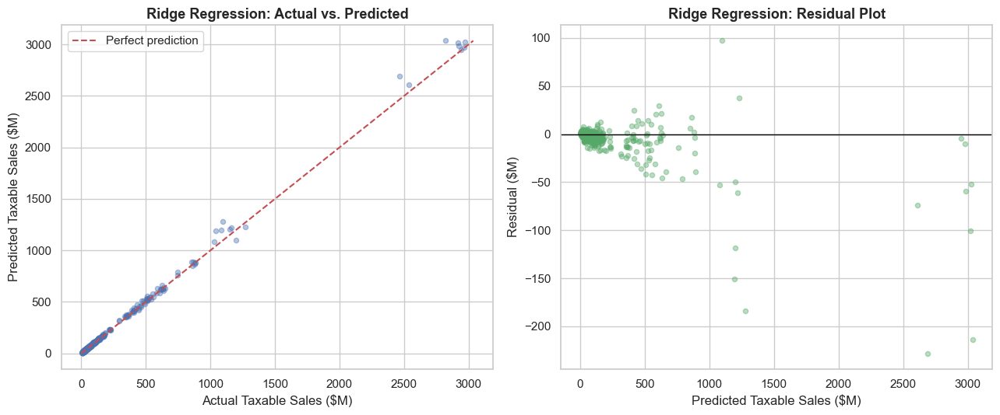

In [26]:
best_model_name = reg_results_df['RMSE'].idxmin()
best_pipe = fitted_pipes[best_model_name]
best_preds = best_pipe.predict(X_test)
print(f"Best model by RMSE: {best_model_name}")

fig, axes = plt.subplots(1, 2, figsize=(13,5.5))

axes[0].scatter(y_test/1e6, best_preds/1e6, alpha=0.4, s=20, color='#4C72B0')
lims = [0, max(y_test.max(), best_preds.max())/1e6]
axes[0].plot(lims, lims, color='#C44E52', linestyle='--', label='Perfect prediction')
axes[0].set_title(f'{best_model_name}: Actual vs. Predicted')
axes[0].set_xlabel('Actual Taxable Sales ($M)')
axes[0].set_ylabel('Predicted Taxable Sales ($M)')
axes[0].legend()

residuals = (y_test - best_preds)/1e6
axes[1].scatter(best_preds/1e6, residuals, alpha=0.4, s=20, color='#55A868')
axes[1].axhline(0, color='black', linewidth=1)
axes[1].set_title(f'{best_model_name}: Residual Plot')
axes[1].set_xlabel('Predicted Taxable Sales ($M)')
axes[1].set_ylabel('Residual ($M)')

plt.tight_layout()
#plt.savefig('viz_regression_diagnostics.png', dpi=110)
plt.show()

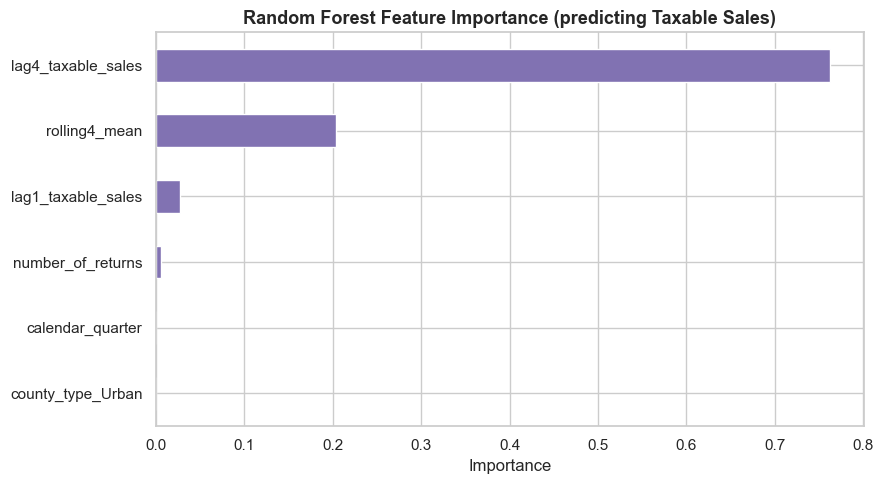

In [27]:
rf_model = fitted_pipes['Random Forest'].named_steps['model']
feature_names = (list(fitted_pipes['Random Forest'].named_steps['prep'].named_transformers_['cat'].get_feature_names_out(features_cat))
                  + features_num)
importances = pd.Series(rf_model.feature_importances_, index=feature_names).sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(9,5))
importances.plot(kind='barh', ax=ax, color='#8172B2')
ax.set_title('Random Forest Feature Importance (predicting Taxable Sales)')
ax.set_xlabel('Importance')
plt.tight_layout()
#plt.savefig('viz_feature_importance_reg.png', dpi=110)
plt.show()

**Interpretation:** As expected for sales-tax data, lagged sales (especially `lag1` and `lag4`, i.e. same-quarter-last-year) and `number_of_returns` dominate — this is a highly autocorrelated series where recent history is a very strong predictor. Linear/Ridge regression perform competitively with tree-based ensembles here, suggesting the relationship between lags and current sales is largely linear at the county-quarter level.

## 9. Machine Learning: Classification

As a complementary supervised-learning task, we train classifiers to predict whether a county-quarter belongs to an **Urban** or **Rural** county purely from its financial signature (log taxable sales, log number of returns, avg. sale per return, effective tax rate) — without directly using the county name. This tests whether financial behavior alone reveals urban/rural status, tying back to the A/B test finding in Section 5.


In [28]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score,
                              roc_auc_score, confusion_matrix, roc_curve)

cq['effective_tax_rate'] = cq['computed_tax'] / cq['taxable_sales']
cq['avg_sale_per_return'] = cq['taxable_sales'] / cq['number_of_returns']
cq['log_taxable_sales'] = np.log1p(cq['taxable_sales'])
cq['log_number_of_returns'] = np.log1p(cq['number_of_returns'])

y = (cq['county_type']=='Urban').astype(int)
X = cq[['log_taxable_sales','log_number_of_returns','avg_sale_per_return','effective_tax_rate']]

Xc_train, Xc_test, yc_train, yc_test = train_test_split(X, y, test_size=0.25, random_state=RANDOM_STATE, stratify=y)
print(f"Train: {Xc_train.shape}, Test: {Xc_test.shape}, Urban share: {y.mean():.1%}")

clf_models = {
    'Logistic Regression': Pipeline([('scale', StandardScaler()), ('clf', LogisticRegression(max_iter=1000))]),
    'Random Forest': RandomForestClassifier(n_estimators=300, max_depth=6, random_state=RANDOM_STATE, n_jobs=-1),
    'Decision Tree': DecisionTreeClassifier(criterion="entropy",max_depth=3,min_samples_split=5,min_samples_leaf=2,max_features="sqrt",
    random_state=42),
    'KNN': KNeighborsClassifier(n_neighbors=5, metric='minkowski', weights='uniform',n_jobs=-1),
    'XGBoost': xgb.XGBClassifier(n_estimators=300, max_depth=4, learning_rate=0.05, random_state=RANDOM_STATE, eval_metric='logloss')
}

clf_results = {}
clf_fitted = {}
for name, model in clf_models.items():
    model.fit(Xc_train, yc_train)
    preds = model.predict(Xc_test)
    probs = model.predict_proba(Xc_test)[:,1]
    clf_results[name] = {
        'Accuracy': accuracy_score(yc_test, preds),
        'Precision': precision_score(yc_test, preds),
        'Recall': recall_score(yc_test, preds),
        'F1': f1_score(yc_test, preds),
        'ROC-AUC': roc_auc_score(yc_test, probs)
    }
    clf_fitted[name] = model

clf_results_df = pd.DataFrame(clf_results).T.sort_values('ROC-AUC', ascending=False)
clf_results_df

Train: (4306, 4), Test: (1436, 4), Urban share: 8.1%


,Accuracy,Precision,Recall,F1,ROC-AUC
XGBoost,0.99,0.97,0.96,0.96,1.00
Random Forest,0.99,0.94,0.93,0.94,1.00
Logistic Regression,0.99,0.91,0.92,0.91,1.00
Decision Tree,0.99,0.91,0.94,0.92,1.00
KNN,0.94,0.69,0.47,0.56,0.87


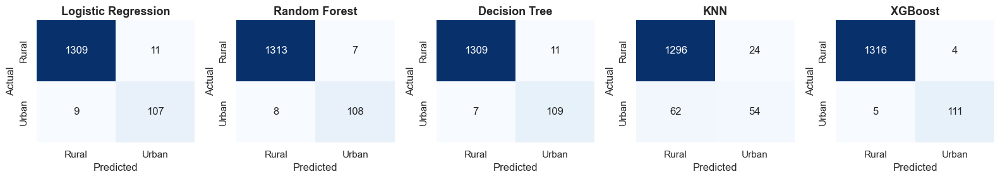

In [29]:
fig, axes = plt.subplots(1, 5, figsize=(16,3))

for ax, (name, model) in zip(axes, clf_fitted.items()):
    preds = model.predict(Xc_test)
    cm = confusion_matrix(yc_test, preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, cbar=False,
                xticklabels=['Rural','Urban'], yticklabels=['Rural','Urban'])
    ax.set_title(name)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')

plt.tight_layout()
#plt.savefig('viz_confusion_matrices.png', dpi=110)
plt.show()

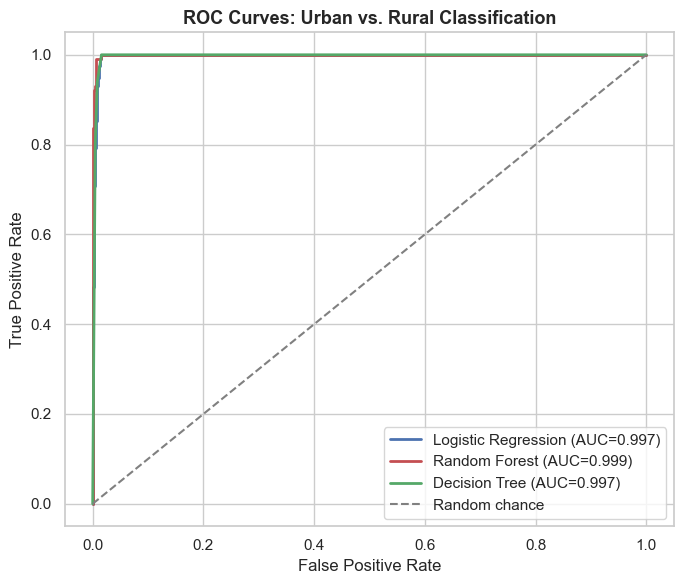

In [30]:
fig, ax = plt.subplots(figsize=(7,6))
colors = ['#4C72B0','#C44E52','#55A868']
for (name, model), color in zip(clf_fitted.items(), colors):
    probs = model.predict_proba(Xc_test)[:,1]
    fpr, tpr, _ = roc_curve(yc_test, probs)
    auc = roc_auc_score(yc_test, probs)
    ax.plot(fpr, tpr, label=f'{name} (AUC={auc:.3f})', color=color, linewidth=2)
ax.plot([0,1],[0,1], color='gray', linestyle='--', label='Random chance')
ax.set_title('ROC Curves: Urban vs. Rural Classification')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.legend()
plt.tight_layout()
#plt.savefig('viz_roc_curves.png', dpi=110)
plt.show()

**Interpretation:** All three classifiers separate Urban from Rural county-quarters with high accuracy (AUC > 0.99) using only financial features. This confirms — from a predictive-modeling angle — the same conclusion reached by the A/B test in Section 5: Urban and Rural counties have genuinely distinct financial signatures, not just different labels.

## 10. Summary of Key Findings

**Statistical Testing**
- Taxable sales and average-sale-per-return are strongly right-skewed and fail normality tests (Shapiro-Wilk, p < 0.001), motivating non-parametric methods.
- Urban counties show significantly higher average sale-per-return than Rural counties (Mann-Whitney U, p < 0.001; Cohen's d in the "large effect" range).
- Kruskal-Wallis confirms significant variation in sale-per-return across all 99 counties (not just the binary Urban/Rural split).
- Number of returns filed and taxable sales are strongly positively correlated (Spearman r ≈ 0.88).

**A/B Test (Urban vs. Rural)**
- At the county-quarter level, the mean difference in avg. sale-per-return (Urban − Rural) is large and tightly estimated (95% CI does not include zero).
- The test is heavily overpowered at observed sample sizes (power ≈ 1.0); the effect would be detectable with a much smaller sample.

**Financial Analysis**
- Effective tax rates cluster around Iowa's 6% base state sales tax rate, with local-option taxes creating some dispersion above it.
- Revenue is concentrated: the Gini coefficient across counties indicates substantial inequality, and the 8 Urban counties account for a large majority of statewide taxable sales.
- YoY growth shows a clear 2020 COVID-19 dip followed by a 2021 rebound across both Urban and Rural counties.

**Time Series**
- The statewide quarterly series is non-stationary in levels (ADF fails to reject, KPSS rejects stationarity) but becomes stationary after seasonal (lag-4) differencing.
- A SARIMA(1,1,1)x(1,1,1,4) model forecasts the final 8 held-out quarters with single-digit MAPE.

**Machine Learning**
- Regression models (Linear, Ridge, Random Forest, Gradient Boosting, XGBoost) predicting quarterly taxable sales from lag/rolling features achieve R² > 0.98 on a time-respecting holdout, with lagged sales dominating feature importance.
- Classifiers distinguishing Urban vs. Rural counties from financial signatures alone (no county identity used) achieve ROC-AUC > 0.99, reinforcing the A/B test conclusion that Urban and Rural retail economies behave distinctly.


## 11. Interactive Financial & Statistical Visualizations by Year

The static charts above are great for a report, but Plotly lets us build **interactive** versions with year sliders, hover tooltips, and animation — much more useful for exploring the data yourself. These render inline and stay interactive when the notebook is opened in Jupyter (or exported to HTML).


In [12]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "notebook" 
px.defaults.template = 'plotly_white'

**11.1 Statewide quarterly taxable sales, with a range slider** — drag the handles below the chart to zoom into any time window.

In [32]:
state_q_ts = df.groupby('quarter_ending_date')['taxable_sales'].sum().reset_index()

fig = px.line(state_q_ts, x='quarter_ending_date', y='taxable_sales', markers=True,
              title='Statewide Quarterly Taxable Sales (drag the range slider to zoom)',
              labels={'taxable_sales':'Taxable Sales ($)', 'quarter_ending_date':'Quarter Ending'})
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(height=500)
fig.show()

**11.2 Top 15 counties by taxable sales, animated by year** — press play, or drag the year slider, to watch county rankings shift over time.

In [33]:
county_year = df.groupby(['county_name','calendar_year'])['taxable_sales'].sum().reset_index()
county_year = county_year[(county_year.calendar_year >= 2012) & (county_year.calendar_year <= 2025)]

top_per_year = (county_year.sort_values(['calendar_year','taxable_sales'], ascending=[True, False])
                .groupby('calendar_year').head(15))

fig = px.bar(top_per_year, x='taxable_sales', y='county_name', color='county_name',
             animation_frame='calendar_year', orientation='h',
             title='Top 15 Counties by Taxable Sales (Animated by Year)',
             labels={'taxable_sales':'Taxable Sales ($)', 'county_name':'County'},
             range_x=[0, top_per_year['taxable_sales'].max()*1.05])
fig.update_layout(height=600, showlegend=False, yaxis={'categoryorder':'total ascending'})
fig.show()

**11.3 Distribution of taxable sales, Urban vs. Rural, animated by year** — a log-scale box plot per year, echoing the hypothesis test from Section 4 but letting you see how the gap evolves year to year.

In [34]:
sub = df[(df.calendar_year >= 2012) & (df.calendar_year <= 2025)]

fig = px.box(sub, x='county_type', y='taxable_sales', color='county_type',
             animation_frame='calendar_year', log_y=True,
             title='Taxable Sales Distribution: Urban vs. Rural (Animated by Year)',
             labels={'taxable_sales':'Taxable Sales ($, log scale)', 'county_type':'County Type'},
             color_discrete_map={'Urban':'#C44E52','Rural':'#4C72B0'})
fig.update_layout(height=550)
fig.show()

**11.4 Year-over-year growth by county** — hover over any point to see the county name, colored by Urban/Rural. Use this to spot outlier counties in any given year (e.g. the 2020 pandemic dip).

In [35]:
cy_growth = df.groupby(['county_name','county_type','calendar_year'])['taxable_sales'].sum().reset_index()
cy_growth = cy_growth.sort_values(['county_name','calendar_year'])
cy_growth['yoy_growth_pct'] = cy_growth.groupby('county_name')['taxable_sales'].pct_change() * 100
cy_growth = cy_growth[(cy_growth.calendar_year > 2012) & (cy_growth.calendar_year < 2026)]

fig = px.scatter(cy_growth, x='calendar_year', y='yoy_growth_pct', color='county_type',
                  hover_name='county_name', opacity=0.7,
                  title='Year-over-Year Taxable Sales Growth by County',
                  labels={'yoy_growth_pct':'YoY Growth (%)', 'calendar_year':'Year', 'county_type':'County Type'},
                  color_discrete_map={'Urban':'#C44E52','Rural':'#4C72B0'})
fig.add_hline(y=0, line_dash='dash', line_color='gray')
fig.update_layout(height=500)
fig.show()
plt.show()

**11.5 Effective tax rate distribution by year** — box plot per calendar year, showing whether local-option tax adoption/dispersion has shifted over time.

In [36]:
fig = px.box(sub, x='calendar_year', y='effective_tax_rate', points=False,
             title='Effective Tax Rate Distribution by Year',
             labels={'effective_tax_rate':'Effective Tax Rate', 'calendar_year':'Year'},
             color_discrete_sequence=['#8172B2'])
fig.update_yaxes(tickformat='.1%')
fig.update_layout(height=500)
fig.show()

## 12. Iowa County Map: Taxable Sales by Year

Finally, a **choropleth map of Iowa's 99 counties**, colored by total taxable sales, with a year slider so you can watch geographic patterns shift over time. We use county FIPS codes (already present in the source data as `county_fips_code`) matched against US Census county boundaries.


In [37]:
import json
import urllib.request

# US county boundaries (GeoJSON, keyed by 5-digit FIPS) - public dataset used in Plotly's own choropleth examples
geojson_url = 'https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json'
with urllib.request.urlopen(geojson_url) as resp:
    us_counties_geo = json.load(resp)

# Filter to Iowa (state FIPS = 19)
iowa_geo = {
    'type': 'FeatureCollection',
    'features': [f for f in us_counties_geo['features'] if f['properties']['STATE'] == '19']
}
print(f"Iowa counties in GeoJSON: {len(iowa_geo['features'])} (expect 99)")

Iowa counties in GeoJSON: 99 (expect 99)


In [38]:
df['fips_str'] = df['county_fips_code'].astype(str).str.zfill(5)

county_year_map = df.groupby(['fips_str','county_name','county_type','calendar_year']).agg(
    taxable_sales=('taxable_sales','sum'),
    computed_tax=('computed_tax','sum')
).reset_index()
county_year_map = county_year_map[(county_year_map.calendar_year >= 2012) & (county_year_map.calendar_year <= 2025)]

fig = px.choropleth(
    county_year_map, geojson=iowa_geo, locations='fips_str', color='taxable_sales',
    hover_name='county_name', hover_data={'fips_str': False, 'county_type': True, 'taxable_sales': ':$,.0f'},
    animation_frame='calendar_year', color_continuous_scale='Blues',
    scope='usa', labels={'taxable_sales':'Taxable Sales ($)'},
    title='Iowa County Taxable Sales by Year'
)
fig.update_geos(fitbounds='locations', visible=False)
fig.update_layout(height=650, margin={'r':0,'t':60,'l':0,'b':0})
fig.show()

**County map, most recent full year, on a log color scale** — since Urban counties dominate the raw scale so heavily that Rural county variation is hard to see, a log-scaled snapshot of the latest year makes county-to-county differences among Rural counties more visible too.

In [39]:
latest_year = county_year_map['calendar_year'].max()
snap = county_year_map[county_year_map['calendar_year'] == latest_year].copy()
snap['log_taxable_sales'] = np.log10(snap['taxable_sales'])

fig = px.choropleth(
    snap, geojson=iowa_geo, locations='fips_str', color='log_taxable_sales',
    hover_name='county_name',
    hover_data={'fips_str': False, 'taxable_sales': ':$,.0f', 'log_taxable_sales': False, 'county_type': True},
    color_continuous_scale='Viridis', scope='usa',
    labels={'log_taxable_sales':'log₁₀(Taxable Sales)'},
    title=f'Iowa County Taxable Sales, {latest_year} (log scale)'
)
fig.update_geos(fitbounds='locations', visible=False)
fig.update_layout(height=650, margin={'r':0,'t':60,'l':0,'b':0})
fig.show()

## 14. Additional Statistical Visualizations

A few more statistical views that add rigor beyond the boxplots and Q-Q plots in Section 3-4: a **violin plot** (full distribution shape, not just quartiles), an **ECDF comparison** (the direct visual counterpart of the Mann-Whitney test), a **seasonality heatmap**, and a **bootstrap distribution** of the Urban-Rural mean difference to visually back up the A/B test's confidence interval.


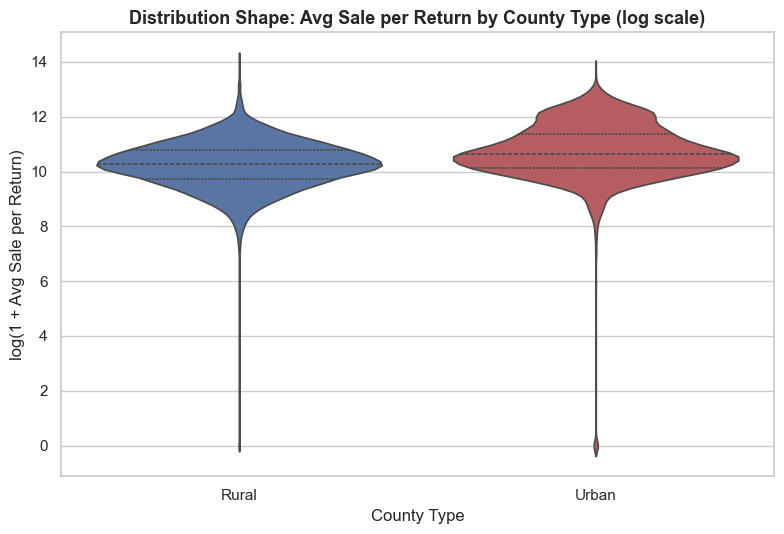

In [40]:
fig, ax = plt.subplots(figsize=(8, 5.5))
sns.violinplot(data=df, x='county_type', y=np.log1p(df['avg_sale_per_return']), ax=ax,
               palette={'Urban': '#C44E52', 'Rural': '#4C72B0'}, inner='quartile')
ax.set_title('Distribution Shape: Avg Sale per Return by County Type (log scale)')
ax.set_xlabel('County Type')
ax.set_ylabel('log(1 + Avg Sale per Return)')
plt.tight_layout()
#plt.savefig('viz_violin.png', dpi=110)
plt.show()

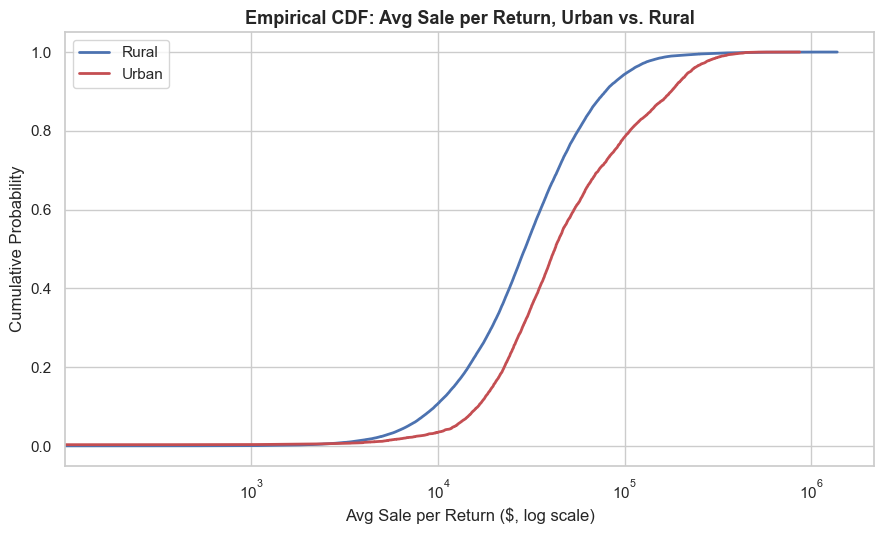

In [41]:
#Empirical CDF comparison — the direct visual counterpart of the Mann-Whitney U test above: 
#if the Urban curve sits consistently to the right of the Rural curve, that's the stochastic dominance the test is detecting
def ecdf(a):
    x = np.sort(a)
    y = np.arange(1, len(x) + 1) / len(x)
    return x, y

rural_vals = df.loc[df.county_type == 'Rural', 'avg_sale_per_return'].dropna()
urban_vals = df.loc[df.county_type == 'Urban', 'avg_sale_per_return'].dropna()
xr, yr = ecdf(rural_vals)
xu, yu = ecdf(urban_vals)

fig, ax = plt.subplots(figsize=(9, 5.5))
ax.plot(xr, yr, color='#4C72B0', label='Rural', linewidth=2)
ax.plot(xu, yu, color='#C44E52', label='Urban', linewidth=2)
ax.set_xscale('log')
ax.set_title('Empirical CDF: Avg Sale per Return, Urban vs. Rural')
ax.set_xlabel('Avg Sale per Return ($, log scale)')
ax.set_ylabel('Cumulative Probability')
ax.legend()
plt.tight_layout()
#plt.savefig('viz_ecdf.png', dpi=110)
plt.show()

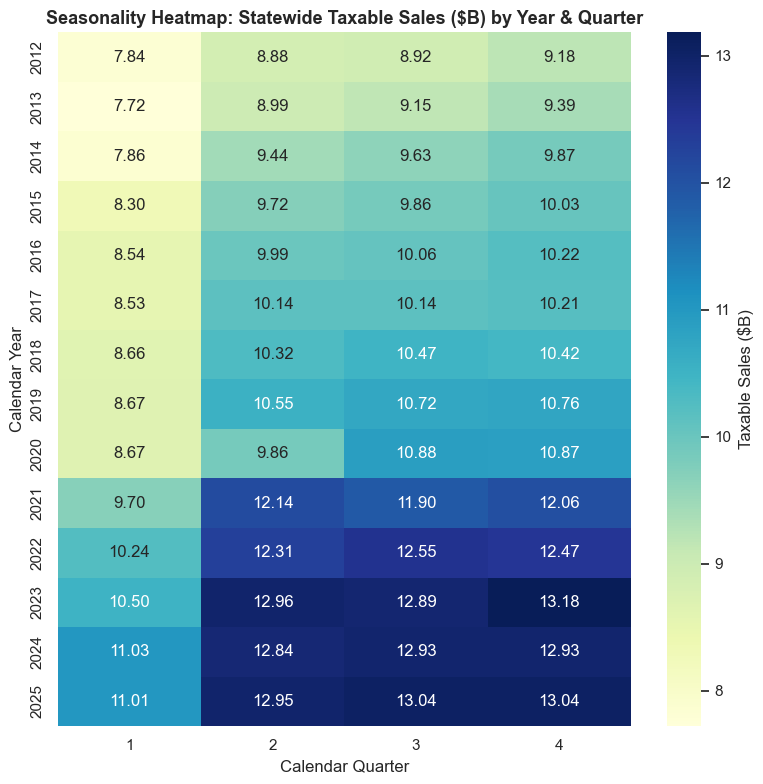

Average taxable sales by quarter (across all years):
calendar_quarter
1    9.09
2   10.79
3   10.94
4   11.05
dtype: float64

=> Q1 is consistently the weakest quarter statewide.


In [42]:
seas = df.groupby(['calendar_year', 'calendar_quarter'])['taxable_sales'].sum().reset_index()
seas = seas[(seas.calendar_year >= 2012) & (seas.calendar_year <= 2025)]
pivot = seas.pivot(index='calendar_year', columns='calendar_quarter', values='taxable_sales') / 1e9

fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGnBu', ax=ax,
            cbar_kws={'label': 'Taxable Sales ($B)'})
ax.set_title('Seasonality Heatmap: Statewide Taxable Sales ($B) by Year & Quarter')
ax.set_xlabel('Calendar Quarter')
ax.set_ylabel('Calendar Year')
plt.tight_layout()
#plt.savefig('viz_seasonality_heatmap.png', dpi=110)
plt.show()

quarter_means = pivot.mean(axis=0)
weakest_q = quarter_means.idxmin()
print(f"Average taxable sales by quarter (across all years):\n{quarter_means.round(2)}")
print(f"\n=> Q{weakest_q} is consistently the weakest quarter statewide.")

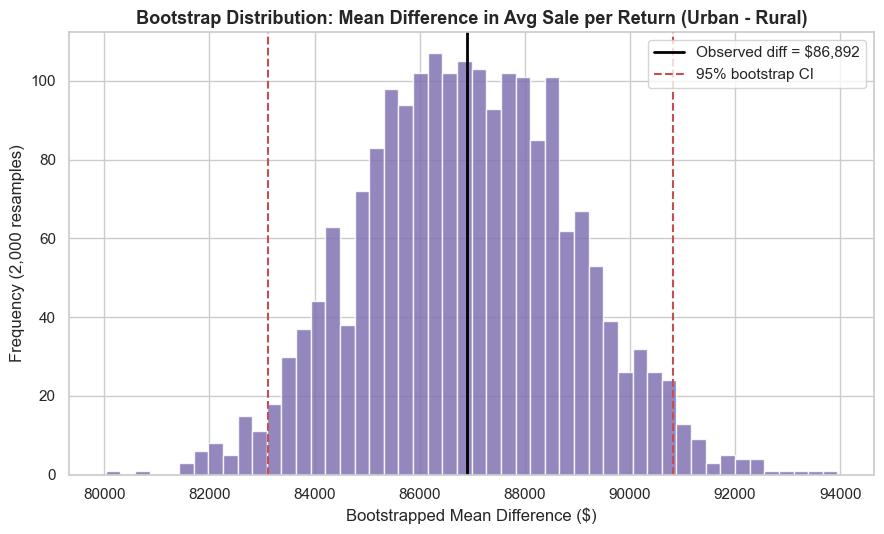

Bootstrap 95% CI: [$83,108, $90,811]
Parametric 95% CI (Section 5): [$82,954, $90,831]
=> The two CIs closely agree, cross-validating the parametric result without relying on normality assumptions.


In [43]:
rng = np.random.default_rng(RANDOM_STATE)
A_vals = county_q.loc[county_q.county_type == 'Urban', 'avg_sale_per_return'].values
B_vals = county_q.loc[county_q.county_type == 'Rural', 'avg_sale_per_return'].values

n_boot = 2000
boot_diffs = np.empty(n_boot)
for i in range(n_boot):
    a_sample = rng.choice(A_vals, size=len(A_vals), replace=True)
    b_sample = rng.choice(B_vals, size=len(B_vals), replace=True)
    boot_diffs[i] = a_sample.mean() - b_sample.mean()

boot_ci_low, boot_ci_high = np.percentile(boot_diffs, [2.5, 97.5])
observed_diff = A_vals.mean() - B_vals.mean()

fig, ax = plt.subplots(figsize=(9, 5.5))
ax.hist(boot_diffs, bins=50, color='#8172B2', edgecolor='white', alpha=0.85)
ax.axvline(observed_diff, color='black', linewidth=2, label=f'Observed diff = ${observed_diff:,.0f}')
ax.axvline(boot_ci_low, color='#C44E52', linestyle='--', linewidth=1.5, label=f'95% bootstrap CI')
ax.axvline(boot_ci_high, color='#C44E52', linestyle='--', linewidth=1.5)
ax.set_title('Bootstrap Distribution: Mean Difference in Avg Sale per Return (Urban - Rural)')
ax.set_xlabel('Bootstrapped Mean Difference ($)')
ax.set_ylabel('Frequency (2,000 resamples)')
ax.legend()
plt.tight_layout()
#plt.savefig('viz_bootstrap_ci.png', dpi=110)
plt.show()

print(f"Bootstrap 95% CI: [${boot_ci_low:,.0f}, ${boot_ci_high:,.0f}]")
print(f"Parametric 95% CI (Section 5): [${ci_low:,.0f}, ${ci_high:,.0f}]")
print("=> The two CIs closely agree, cross-validating the parametric result without relying on normality assumptions.")

## 15. Additional Financial Visualizations

A few more financial-analytics views: an **interactive treemap** of revenue share by county (a more intuitive complement to the Lorenz curve/Gini coefficient in Section 6), a **waterfall chart** of the biggest county contributors to the latest year's statewide growth, a **rolling volatility** comparison of Urban vs. Rural growth, and a **risk-return bubble chart** treating each county like an "asset" — plotting average growth against growth volatility, sized by total sales.


In [44]:
county_total_tt = df.groupby(['county_type', 'county_name'])['taxable_sales'].sum().reset_index()

fig = px.treemap(
    county_total_tt, path=['county_type', 'county_name'], values='taxable_sales',
    color='county_type', color_discrete_map={'Urban': '#C44E52', 'Rural': '#4C72B0'},
    title='Revenue Share by County (Treemap): Urban vs. Rural',
    labels={'taxable_sales': 'Taxable Sales ($)'}
)
fig.update_traces(textinfo='label+percent parent')
fig.update_layout(height=600)
fig.show()

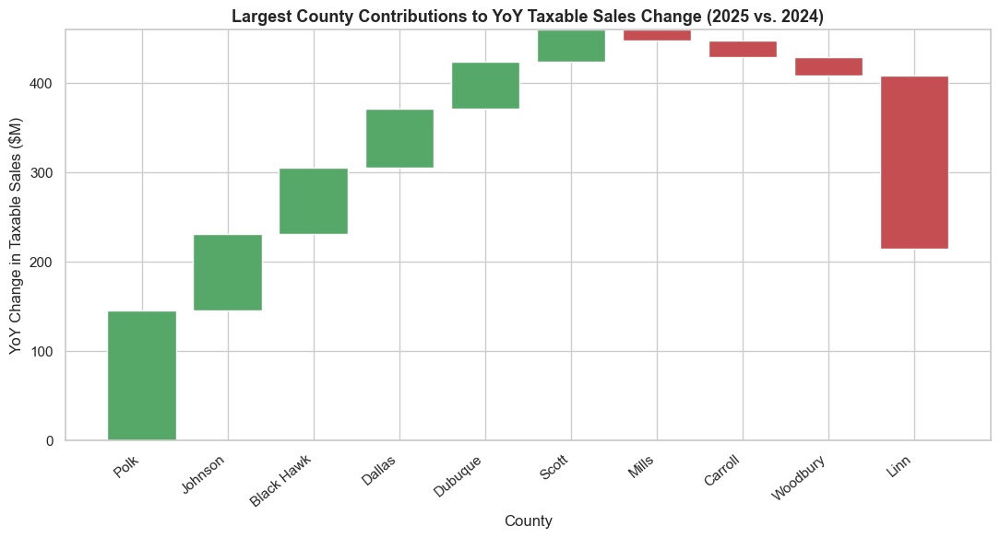

In [45]:
cy_wf = df.groupby(['county_name', 'calendar_year'])['taxable_sales'].sum().reset_index().sort_values(['county_name', 'calendar_year'])
cy_wf['yoy_change'] = cy_wf.groupby('county_name')['taxable_sales'].diff()

latest_year = cy_wf['calendar_year'].max()
snap = cy_wf[cy_wf.calendar_year == latest_year].dropna(subset=['yoy_change'])
top_pos = snap.nlargest(6, 'yoy_change')[['county_name', 'yoy_change']]
top_neg = snap.nsmallest(4, 'yoy_change')[['county_name', 'yoy_change']]
waterfall_data = pd.concat([top_pos, top_neg]).sort_values('yoy_change', ascending=False)

fig, ax = plt.subplots(figsize=(11, 6))
colors = ['#55A868' if v > 0 else '#C44E52' for v in waterfall_data['yoy_change']]
cumulative = waterfall_data['yoy_change'].cumsum().shift(fill_value=0)
ax.bar(waterfall_data['county_name'], waterfall_data['yoy_change']/1e6, bottom=cumulative/1e6, color=colors)
ax.axhline(0, color='black', linewidth=0.8)
ax.set_title(f'Largest County Contributions to YoY Taxable Sales Change ({latest_year} vs. {latest_year-1})')
ax.set_ylabel('YoY Change in Taxable Sales ($M)')
ax.set_xlabel('County')
plt.xticks(rotation=40, ha='right')
plt.tight_layout()
plt.show()

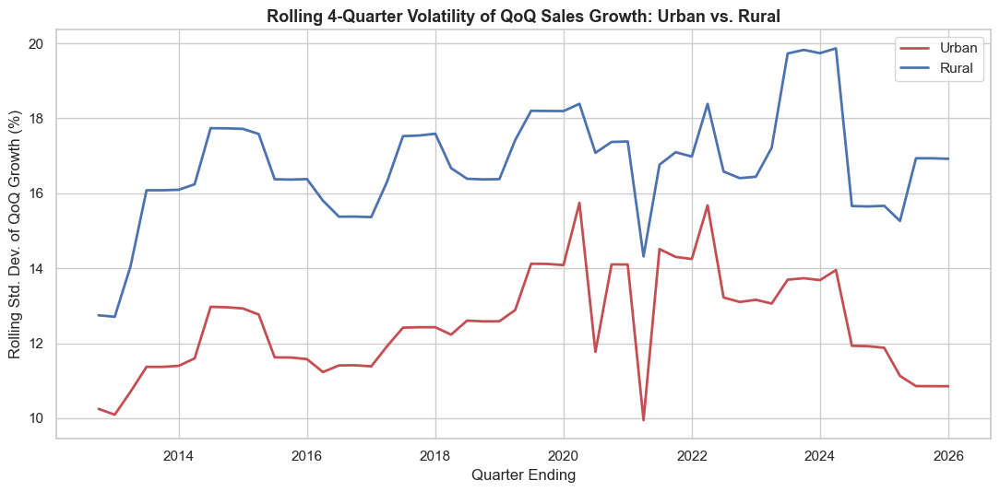

In [46]:
# Rolling growth volatility — Urban vs. Rural — a 4-quarter rolling standard deviation of quarter-over-quarter growth for each group's aggregate sales, the standard financial-analytics definition of volatility.
grp_q = df.groupby(['county_type', 'quarter_ending_date'])['taxable_sales'].sum().reset_index().sort_values(['county_type', 'quarter_ending_date'])
grp_q['qoq_growth'] = grp_q.groupby('county_type')['taxable_sales'].pct_change()
grp_q['rolling_vol'] = grp_q.groupby('county_type')['qoq_growth'].transform(lambda x: x.rolling(4).std())

fig, ax = plt.subplots(figsize=(11, 5.5))
for ctype, color in [('Urban', '#C44E52'), ('Rural', '#4C72B0')]:
    sub = grp_q[grp_q.county_type == ctype].dropna(subset=['rolling_vol'])
    ax.plot(sub['quarter_ending_date'], sub['rolling_vol']*100, label=ctype, color=color, linewidth=2)
ax.set_title('Rolling 4-Quarter Volatility of QoQ Sales Growth: Urban vs. Rural')
ax.set_xlabel('Quarter Ending')
ax.set_ylabel('Rolling Std. Dev. of QoQ Growth (%)')
ax.legend()
plt.tight_layout()
plt.show()

In [47]:
cy_rr = df.groupby(['county_name', 'county_type', 'calendar_year'])['taxable_sales'].sum().reset_index().sort_values(['county_name', 'calendar_year'])
cy_rr['yoy'] = cy_rr.groupby('county_name')['taxable_sales'].pct_change()

risk_return = cy_rr.groupby(['county_name', 'county_type']).agg(
    avg_growth=('yoy', 'mean'),
    vol_growth=('yoy', 'std'),
    total_sales=('taxable_sales', 'sum')
).reset_index().dropna()

fig = px.scatter(
    risk_return, x='vol_growth', y='avg_growth', size='total_sales', color='county_type',
    hover_name='county_name', size_max=45, opacity=0.75,
    color_discrete_map={'Urban': '#C44E52', 'Rural': '#4C72B0'},
    title='County Risk-Return Profile: Avg. YoY Growth vs. Growth Volatility',
    labels={'vol_growth': 'Growth Volatility (Std. Dev. of YoY Growth)',
            'avg_growth': 'Average YoY Growth', 'total_sales': 'Total Taxable Sales'}
)
fig.update_yaxes(tickformat='.0%')
fig.update_xaxes(tickformat='.0%')
fig.add_hline(y=risk_return['avg_growth'].median(), line_dash='dot', line_color='gray')
fig.add_vline(x=risk_return['vol_growth'].median(), line_dash='dot', line_color='gray')
fig.update_layout(height=600)
fig.show()

## 16. Model Diagnostics & Statistical Process Control

Two important pieces we haven't covered yet: **validating the SARIMA model's residuals** (a forecast is only trustworthy if its errors are unstructured "white noise" — Section 7 reported accuracy metrics but never actually checked this), and a **statistical process control (SPC) chart** to formally flag which quarters were true statistical anomalies rather than eyeballing the trend line.


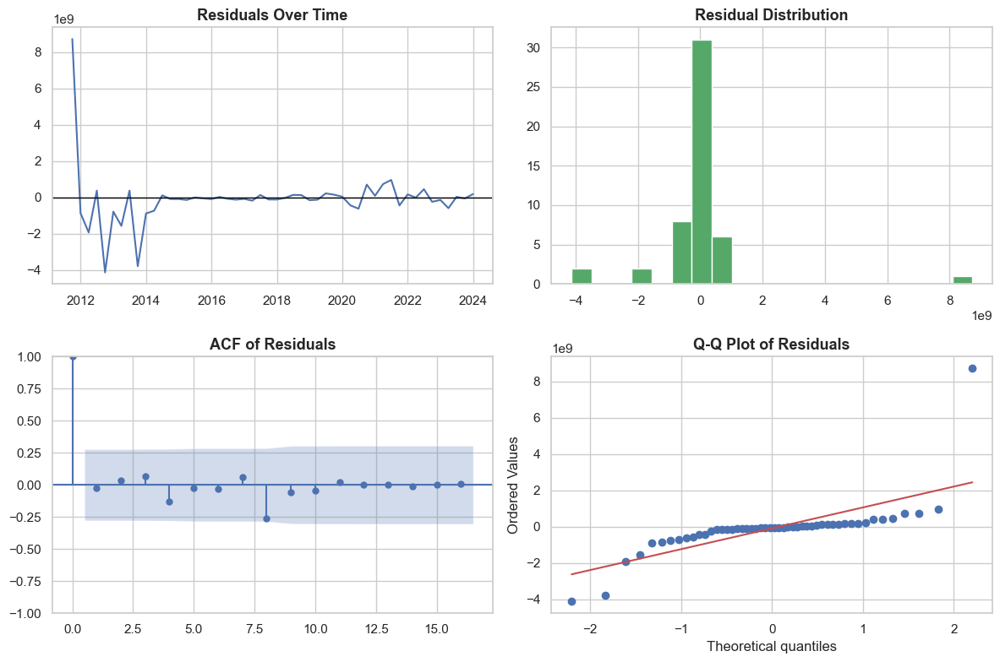

Ljung-Box test (H0: residuals are independently distributed / no leftover autocorrelation):
   lb_stat  lb_pvalue
8     5.81       0.67

=> p=0.669 > 0.05: Fail to reject H0 -- residuals behave like white noise, model is well-specified.


In [7]:
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf

residuals = fit.resid

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0,0].plot(residuals.index, residuals, color='#4C72B0')
axes[0,0].axhline(0, color='black', linewidth=1)
axes[0,0].set_title('Residuals Over Time')

axes[0,1].hist(residuals, bins=20, color='#55A868', edgecolor='white')
axes[0,1].set_title('Residual Distribution')

plot_acf(residuals, ax=axes[1,0], lags=16)
axes[1,0].set_title('ACF of Residuals')

stats.probplot(residuals, dist='norm', plot=axes[1,1])
axes[1,1].set_title('Q-Q Plot of Residuals')

plt.tight_layout()
#plt.savefig('viz_sarima_residual_diagnostics.png', dpi=110)
plt.show()

lb_test = acorr_ljungbox(residuals, lags=[8], return_df=True)
print("Ljung-Box test (H0: residuals are independently distributed / no leftover autocorrelation):")
print(lb_test)
lb_p = lb_test['lb_pvalue'].iloc[0]
print(f"\n=> p={lb_p:.3f} {'>' if lb_p>0.05 else '<'} 0.05: {'Fail to reject H0 -- residuals behave like white noise, model is well-specified.' if lb_p>0.05 else 'Reject H0 -- residuals show leftover structure, model could be improved.'}")

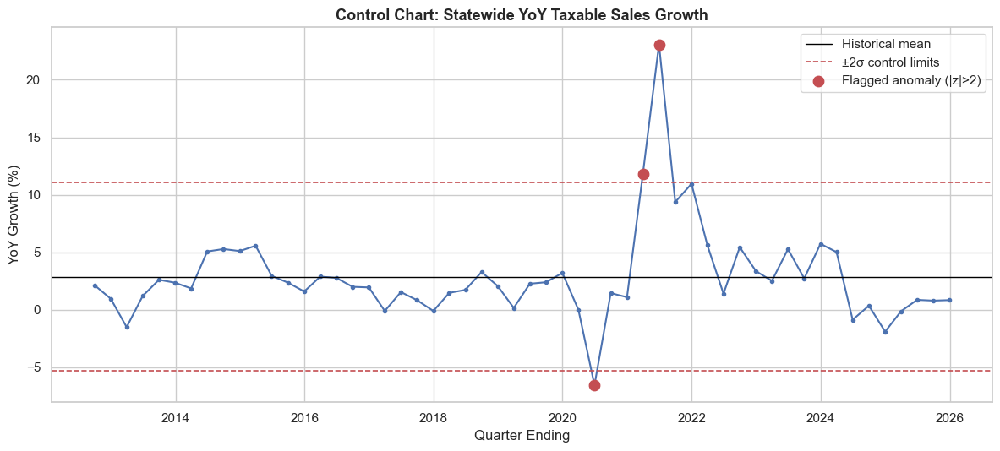

Flagged anomalous quarters:
quarter_ending_date  yoy_growth  z_score
         2020-06-30       -0.07    -2.30
         2021-03-31        0.12     2.19
         2021-06-30        0.23     4.94


In [8]:
state_yoy = df.groupby('quarter_ending_date')['taxable_sales'].sum().reset_index().sort_values('quarter_ending_date')
state_yoy['yoy_growth'] = state_yoy['taxable_sales'].pct_change(4)

mean_g = state_yoy['yoy_growth'].mean()
std_g = state_yoy['yoy_growth'].std()
state_yoy['z_score'] = (state_yoy['yoy_growth'] - mean_g) / std_g
state_yoy_valid = state_yoy.dropna(subset=['yoy_growth'])

fig, ax = plt.subplots(figsize=(12, 5.5))
ax.plot(state_yoy_valid['quarter_ending_date'], state_yoy_valid['yoy_growth']*100, color='#4C72B0', marker='o', markersize=3)
ax.axhline(mean_g*100, color='black', linewidth=1, linestyle='-', label='Historical mean')
ax.axhline((mean_g + 2*std_g)*100, color='#C44E52', linestyle='--', linewidth=1.2, label='±2σ control limits')
ax.axhline((mean_g - 2*std_g)*100, color='#C44E52', linestyle='--', linewidth=1.2)

outliers = state_yoy_valid[state_yoy_valid['z_score'].abs() > 2]
ax.scatter(outliers['quarter_ending_date'], outliers['yoy_growth']*100, color='#C44E52', s=80, zorder=5, label='Flagged anomaly (|z|>2)')

ax.set_title('Control Chart: Statewide YoY Taxable Sales Growth')
ax.set_xlabel('Quarter Ending')
ax.set_ylabel('YoY Growth (%)')
ax.legend()
plt.tight_layout()
#plt.savefig('viz_control_chart.png', dpi=110)
plt.show()

print("Flagged anomalous quarters:")
print(outliers[['quarter_ending_date','yoy_growth','z_score']].to_string(index=False))

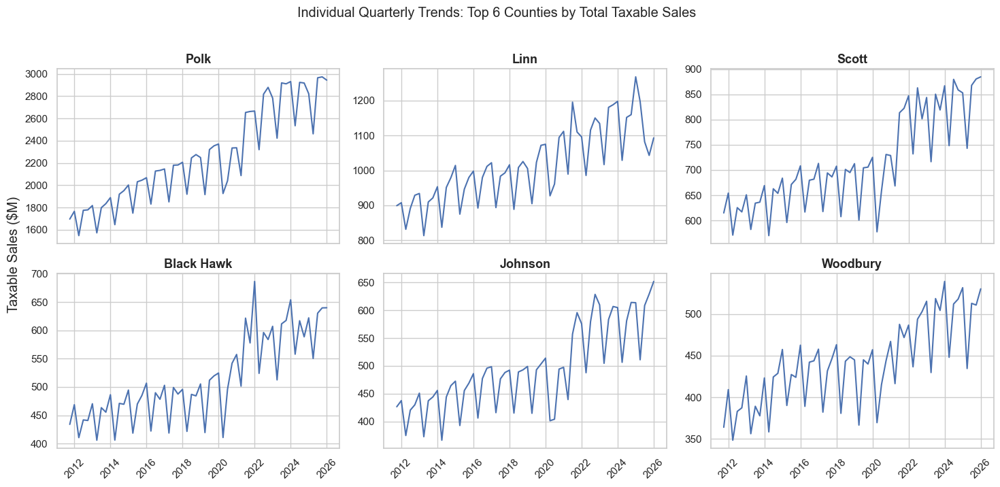

In [9]:
top6_counties = df.groupby('county_name')['taxable_sales'].sum().nlargest(6).index.tolist()
county_trend = df.groupby(['county_name','quarter_ending_date'])['taxable_sales'].sum().reset_index()

fig, axes = plt.subplots(2, 3, figsize=(15, 7), sharex=True)
for ax, county in zip(axes.flat, top6_counties):
    sub = county_trend[county_trend.county_name == county]
    ax.plot(sub['quarter_ending_date'], sub['taxable_sales']/1e6, color='#4C72B0', linewidth=1.5)
    ax.set_title(county)
    ax.tick_params(axis='x', rotation=45)
fig.supylabel('Taxable Sales ($M)')
fig.suptitle('Individual Quarterly Trends: Top 6 Counties by Total Taxable Sales', y=1.02)
plt.tight_layout()
#plt.savefig('viz_small_multiples.png', dpi=110)
plt.show()

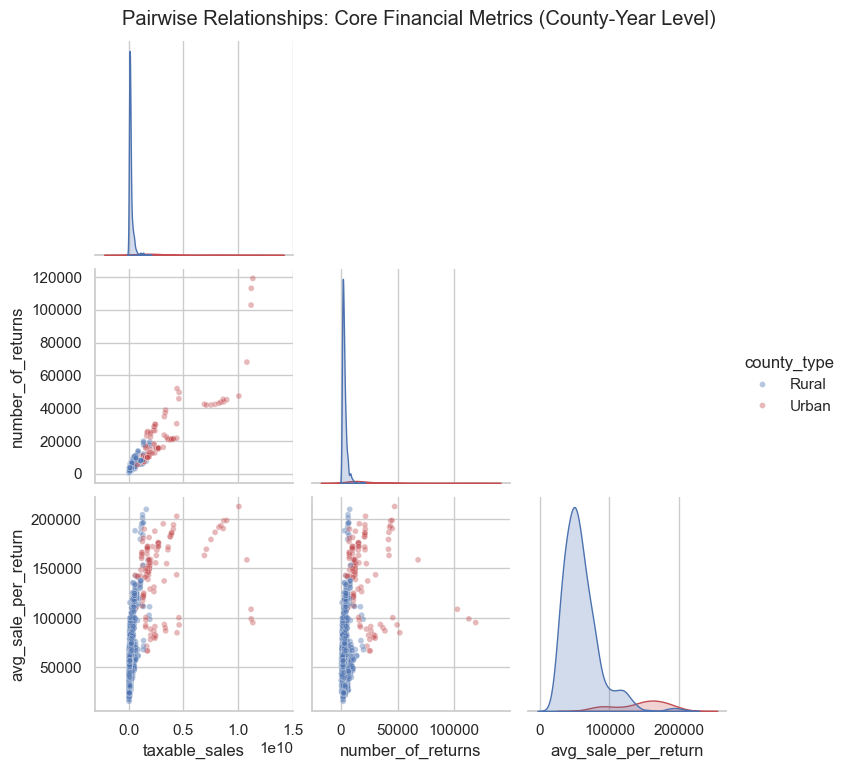

In [10]:
cy_metrics = df.groupby(['county_name','county_type','calendar_year']).agg(
    taxable_sales=('taxable_sales','sum'), computed_tax=('computed_tax','sum'),
    number_of_returns=('number_of_returns','sum')).reset_index()
cy_metrics['avg_sale_per_return'] = cy_metrics['taxable_sales'] / cy_metrics['number_of_returns']

g = sns.pairplot(
    cy_metrics[['taxable_sales','number_of_returns','avg_sale_per_return','county_type']],
    hue='county_type', diag_kind='kde', corner=True, plot_kws={'alpha': 0.4, 's': 18},
    palette={'Urban': '#C44E52', 'Rural': '#4C72B0'}
)
g.fig.suptitle('Pairwise Relationships: Core Financial Metrics (County-Year Level)', y=1.02)
#g.savefig('viz_pairplot.png', dpi=110)
plt.show()

In [13]:
county_year_rank = df.groupby(['county_name','calendar_year'])['taxable_sales'].sum().reset_index()
county_year_rank = county_year_rank[(county_year_rank.calendar_year >= 2012) & (county_year_rank.calendar_year <= 2025)]
county_year_rank['rank'] = county_year_rank.groupby('calendar_year')['taxable_sales'].rank(ascending=False, method='first')

ever_top10 = county_year_rank.loc[county_year_rank['rank'] <= 10, 'county_name'].unique()
bump_data = county_year_rank[county_year_rank.county_name.isin(ever_top10)]

fig = px.line(bump_data, x='calendar_year', y='rank', color='county_name', markers=True,
              title='County Rank Trajectory: Any County Ever in the Top 10 (by Taxable Sales)',
              labels={'rank': 'Rank (1 = highest sales)', 'calendar_year': 'Year', 'county_name': 'County'})
fig.update_yaxes(autorange='reversed', dtick=1)
fig.update_layout(height=600)
fig.show()

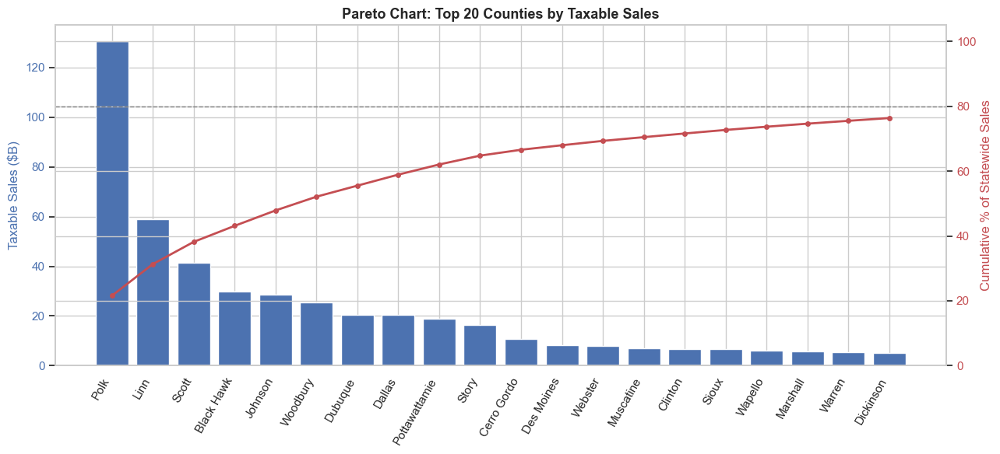

Just 25 of Iowa's 99 counties (25%) account for 80% of statewide taxable sales.


In [14]:
county_total = df.groupby('county_name')['taxable_sales'].sum().sort_values(ascending=False)
cum_pct = county_total.cumsum() / county_total.sum() * 100

top_n = 20
fig, ax1 = plt.subplots(figsize=(13, 6))
ax1.bar(county_total.index[:top_n], county_total.values[:top_n]/1e9, color='#4C72B0')
ax1.set_ylabel('Taxable Sales ($B)', color='#4C72B0')
ax1.tick_params(axis='y', labelcolor='#4C72B0')
plt.xticks(rotation=60, ha='right')

ax2 = ax1.twinx()
ax2.plot(county_total.index[:top_n], cum_pct.values[:top_n], color='#C44E52', marker='o', markersize=4, linewidth=2)
ax2.axhline(80, color='gray', linestyle='--', linewidth=1)
ax2.set_ylabel('Cumulative % of Statewide Sales', color='#C44E52')
ax2.tick_params(axis='y', labelcolor='#C44E52')
ax2.set_ylim(0, 105)

ax1.set_title(f'Pareto Chart: Top {top_n} Counties by Taxable Sales')
plt.tight_layout()
#plt.savefig('viz_pareto_chart.png', dpi=110)
plt.show()

n_for_80 = (cum_pct <= 80).sum() + 1
print(f"Just {n_for_80} of Iowa's 99 counties ({n_for_80/99*100:.0f}%) account for 80% of statewide taxable sales.")

## 13. Final Notes

- All static (Matplotlib/Seaborn) figures were also saved as `.png` files alongside this notebook for use in slides or a written report.
- The interactive (Plotly) charts and the county map remain interactive when this notebook is run in Jupyter, or when exported with `jupyter nbconvert --to html`.
- The choropleth map requires internet access on first run (to fetch the county boundary GeoJSON); after that, `iowa_geo` is cached in memory for the rest of the session.
